<a href="https://colab.research.google.com/github/davidogm/DataScience/blob/main/datamining/Ejemplos2024/min_datos_p2_dbf19_luxury_watches.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Práctica 2: Minería de datos
## Práctica realizada por David Bernabeu Ferrer


## Luxury Watches Dataset
En esta práctica se ha seleccionado el siguiente [dataset](https://www.kaggle.com/datasets/rkiattisak/luxury-watches-price-dataset). Este dataset contiene información acerca de relojes de lujo, la cual presentaremos posteriormente.

Primero de todo, vamos a importar las librerías necesarias para el correcto funcionamiento del cuaderno.

In [ ]:
# Operatoria
import numpy as np
import pandas as pd

# Mostrar todas las columnas
pd.set_option('display.max_columns', None)

# Configurar pandas para que muestre los números flotantes sin notación científica
pd.set_option('display.float_format', lambda x: '%.4f' % x)

# Gráficos
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.figure_factory as ff

from collections import Counter

# Dependencias para balanceo de datos
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.utils import shuffle

# Sistema
import os

# Procesamiento y regresión
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler, Normalizer
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline

from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, f1_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.utils.multiclass import unique_labels

# Algoritmos de clasificación
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier

import warnings
warnings.filterwarnings('ignore')

# Ensembles
from sklearn.ensemble import BaggingClassifier, GradientBoostingClassifier, AdaBoostClassifier, StackingClassifier


# Clustering
from sklearn import cluster, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import plotly.graph_objects as go
from plotly.subplots import make_subplots

import random as rd
rd.seed(0)
# Fijamos semilla para reproducibilidad
np.random.seed(0)

Una vez importadas las librerías, vamos a leer el dataset y mostrar 4 filas del mismo:

In [ ]:
watches_original_df = pd.read_csv("/kaggle/input/luxury-watches-price-dataset/Luxury watch.csv")
watches_original_df.sample(4)

,Brand,Model,Case Material,Strap Material,Movement Type,Water Resistance,Case Diameter (mm),Case Thickness (mm),Band Width (mm),Dial Color,Crystal Material,Complications,Power Reserve,Price (USD)
329,Chopard,Mille Miglia,Stainless Steel,Leather,Automatic,50 meters,42.0000,11.4300,22.0000,Black,Sapphire,Chronograph,48 hours,"6,200"
371,Audemars Piguet,Royal Oak,Stainless Steel,Stainless Steel,Automatic,50 meters,41.0000,9.8000,20.0000,Blue,Sapphire,Date,60 hours,"18,500"
219,Jaeger-LeCoultre,Master Control,Stainless Steel,Leather,Automatic,50 meters,39.0000,8.5000,20.0000,Silver,Sapphire,Date,70 hours,"7,500"
403,Hublot,Big Bang,Titanium,Rubber,Automatic,100 meters,44.0000,14.5000,25.0000,Black,Sapphire,Chronograph,72 hours,"14,000"


Una vez mostradas las filas de ejemplo del dataset, vamos a indagar más a fondo acerca de que representa cada una de las columnas del dataset:
* Brand: Marca del reloj.
* Model: Modelo del reloj.
* Case Material: Material del que está fabricado el reloj en su mayoría.
* Strap material: Material de la correa del reloj.
* Movement Type: Tipo de movimiento usado en el reloj (movimiento de las agujas).
* Water resistance: Resistencia acuatica en metros de profundidad.
* Case Diameter (mm): El diametro de la esfera del reloj.
* Case Thickness (mm): El ancho de la correa o brazalete del reloj en milímetros.
* Dial Color: El color del dial del reloj (por ejemplo, negro, azul, plata).
* Crystal Material: El material utilizado para el cristal del reloj (por ejemplo, zafiro, mineral, hardlex).
* Complications: Cualquier función o característica adicional más allá de la medición del tiempo (por ejemplo, visualización de la fecha, cronógrafo, GMT).
* Power Reserve: La cantidad de tiempo que el reloj puede funcionar sin necesidad de darle cuerda o llevarlo puesto (por ejemplo, 48 horas, 72 horas).
* Price (USD): El precio de venta del reloj en dólares estadounidenses.

In [ ]:
watches_original_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 507 entries, 0 to 506
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Brand                507 non-null    object 
 1   Model                507 non-null    object 
 2   Case Material        507 non-null    object 
 3   Strap Material       507 non-null    object 
 4   Movement Type        507 non-null    object 
 5   Water Resistance     507 non-null    object 
 6   Case Diameter (mm)   507 non-null    float64
 7   Case Thickness (mm)  507 non-null    float64
 8   Band Width (mm)      507 non-null    float64
 9   Dial Color           507 non-null    object 
 10  Crystal Material     507 non-null    object 
 11  Complications        385 non-null    object 
 12  Power Reserve        493 non-null    object 
 13  Price (USD)          506 non-null    object 
dtypes: float64(3), object(11)
memory usage: 55.6+ KB


Como podemos observar, existen algunas columnas como $Power Reserve$, que es de tipo object, cuando en realidad, debería ser de valor numérico, por lo que vamos a realizar una serie de conversiones para las columnas $Power Reserve$, $Price (USD)$ y $Water Resistance$:

In [ ]:
watches_parsed_df = watches_original_df.copy()

# Quitamos la "," y pasamos a numérico
watches_parsed_df['Price (USD)'] = pd.to_numeric(watches_parsed_df['Price (USD)'].str.replace(",",""))

# Spliteamos y quitamos la palabra "meters"
watches_parsed_df['Water Resistance'] = pd.to_numeric(watches_parsed_df['Water Resistance'].str.split().str[0])

Para el tema de la batería ($Power Reserve$), tenemos que hacer una serie de conversiones, ya que en algunos registros viene dado en días y otros en horas, por lo que vamos a tener que realizar una conversión algo más compleja, para ello, definimos la siguiente función y la aplicamos sobre la columna objetivo del dataframe:

In [ ]:
def parse_power_reserve(value):

    if isinstance(value, float):
        return value

    # Primero, reemplazamos las comas para evitar errores al convertir a numérico
    value = value.replace(",", "")

    # Dividimos el valor por espacios
    parts = value.split()

    if len(parts) == 1:
        # Caso de 4,200
        return int(value)

    # Verificamos si el valor está en días para convertirlo a horas
    if 'days' in parts[1].lower():
        # Convertimos días a horas
        return int(parts[0]) * 24
    else:
        # Devolvemos el valor en horas si ya estaba en horas
        return int(parts[0])

watches_parsed_df['Power Reserve'] = watches_parsed_df['Power Reserve'].apply(lambda x: parse_power_reserve(x))

Antes de nada, debido a que nuestra variable respuesta es el $Price (USD)$, vamos a observar si existen valores NaNs en dicha columna:

In [ ]:
watches_parsed_df[watches_parsed_df['Price (USD)'].isna()]

,Brand,Model,Case Material,Strap Material,Movement Type,Water Resistance,Case Diameter (mm),Case Thickness (mm),Band Width (mm),Dial Color,Crystal Material,Complications,Power Reserve,Price (USD)
24,Bell & Ross,BR 03-92,Ceramic,Rubber,Automatic,100,42.0000,9.3000,22.0000,Black,Sapphire,NaN,4200.0000,NaN


Debido a que sí existe y es un único registro, vamos a proceder a eliminar dicho registro de nuestro dataset.

In [ ]:
watches_parsed_df = watches_parsed_df[~watches_parsed_df['Price (USD)'].isna()]

Una vez modificadas las columnas y borrado el registro con valor NaN, vamos a visualizar como se distribuyen los datos en las columnas numéricas, visualizando sus percentiles, valores máximos, mínimos y medias, entre otros datos:

In [ ]:
watches_parsed_df.describe()

,Water Resistance,Case Diameter (mm),Case Thickness (mm),Band Width (mm),Power Reserve,Price (USD)
count,506.0000,506.0000,506.0000,506.0000,492.0000,506.0000
mean,122.3715,41.0443,11.5929,21.1038,81.6870,12082.9644
std,149.3057,2.5375,2.4919,1.6595,366.5767,10419.8170
min,30.0000,27.5000,5.0000,15.0000,38.0000,495.0000
25%,50.0000,40.0000,9.8000,20.0000,45.0000,5500.0000
50%,100.0000,41.0000,12.0250,20.0000,55.0000,8350.0000
75%,120.0000,42.0000,13.3000,22.0000,70.0000,16450.0000
max,2000.0000,46.5000,17.5000,28.0000,6480.0000,70000.0000


Ahora vamos a eliminar las columnas de Brand y Model, ya que, al final son el nombre de los relojes y no influyen para determinar el precio de los relojes, es decir, no aportan información relevante:

In [ ]:
watches_parsed_df = watches_parsed_df.drop(columns=['Brand', 'Model'])
watches_parsed_df.sample(3)

,Case Material,Strap Material,Movement Type,Water Resistance,Case Diameter (mm),Case Thickness (mm),Band Width (mm),Dial Color,Crystal Material,Complications,Power Reserve,Price (USD)
280,Stainless Steel,Stainless Steel,Automatic,100,36.0000,12.5000,20.0000,Black,Sapphire,Date,70.0000,6500.0000
463,Stainless Steel,NATO Strap,Automatic,200,41.0000,11.9000,22.0000,Black,Sapphire,NaN,70.0000,3500.0000
228,Carbon Fiber,Rubber,Automatic,100,44.0000,14.5000,25.0000,Black,Sapphire,Chronograph,72.0000,15000.0000


Ahora vamos a proceder a encodear todas las variables de tipo object, las cuales consideramos como categorías o clases, para ello, hacemos uso de $LabelEncoder$:

In [ ]:
columns_type_object = watches_parsed_df.select_dtypes(include=['object']).columns
label_encoder = LabelEncoder()

for column in columns_type_object:
    watches_parsed_df[column] = label_encoder.fit_transform(watches_parsed_df[column])

watches_parsed_df.sample(3)

,Case Material,Strap Material,Movement Type,Water Resistance,Case Diameter (mm),Case Thickness (mm),Band Width (mm),Dial Color,Crystal Material,Complications,Power Reserve,Price (USD)
35,13,11,0,100,42.0000,9.4000,24.0000,1,3,4,50.0000,10000.0000
64,13,2,0,200,41.0000,12.7000,22.0000,0,3,29,70.0000,4500.0000
316,13,5,0,30,42.3000,14.2000,22.0000,6,3,4,60.0000,8800.0000


Una vez tenemos las variables encodeadas, vamos a ver la relación que existen entre las variables mediante un estudio de correlación entre las variables, concretamente nos fijaremos en la variable respuesta $Price\ (USD)$. Esto lo realizamos para, a posterioiri, quedarnos únicamente con las variables que realmente aporten información y nos ayuden a predecir el resultado. A continuación mostramos la matriz de correlación:

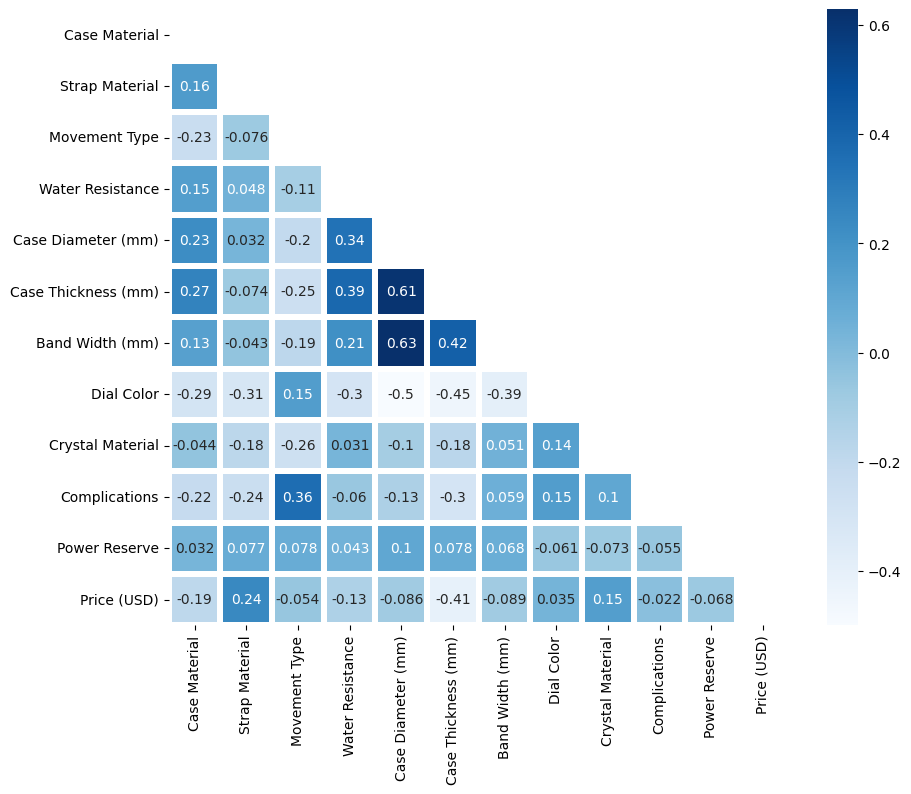

In [ ]:
plt.figure(figsize=(10, 8))
mask_heatmap = np.triu(np.ones_like(watches_parsed_df.corr(), dtype=bool))
sns.heatmap(data=watches_parsed_df.corr(), annot=True, linewidth=3, cmap='Blues', mask=mask_heatmap)
plt.show()

Ahora vamos a mostrar de forma ordenada la correlación que existe entre las distintas variables y la variable respuesta, la cual es $Price (USD)$:

In [ ]:
correlation_matrix = watches_parsed_df.corr()

# Obtenemos las correlaciones de las variables con 'Price'
correlation_with_price = correlation_matrix['Price (USD)'].drop('Price (USD)')

# Ordenamos las correlaciones en orden descendente por el valor absoluto, ya que nos importa cuanto influye,
# no si influye positiva o negativamente.
correlation_with_price_sorted = pd.DataFrame(correlation_with_price.sort_values(ascending=False, key=lambda x: abs(x)))
correlation_with_price_sorted

,Price (USD)
Case Thickness (mm),-0.4085
Strap Material,0.2439
Case Material,-0.1904
Crystal Material,0.1463
Water Resistance,-0.1321
Band Width (mm),-0.0885
Case Diameter (mm),-0.0858
Power Reserve,-0.0681
Movement Type,-0.0543
Dial Color,0.0346


Antes de descartar las columnas y comenzar con las tareas de regresión y clasificación, vamos a realizar una serie de gráficos de nubes de puntos para estudiar como influyen las valores de las distintas variables en la variable respuesta. Este tipo de gráfico es especialmente de utilidad en las variables de tipo cuantitativo, para las que son de tipo cualitativo vamos a mostrar diagramas de caja.

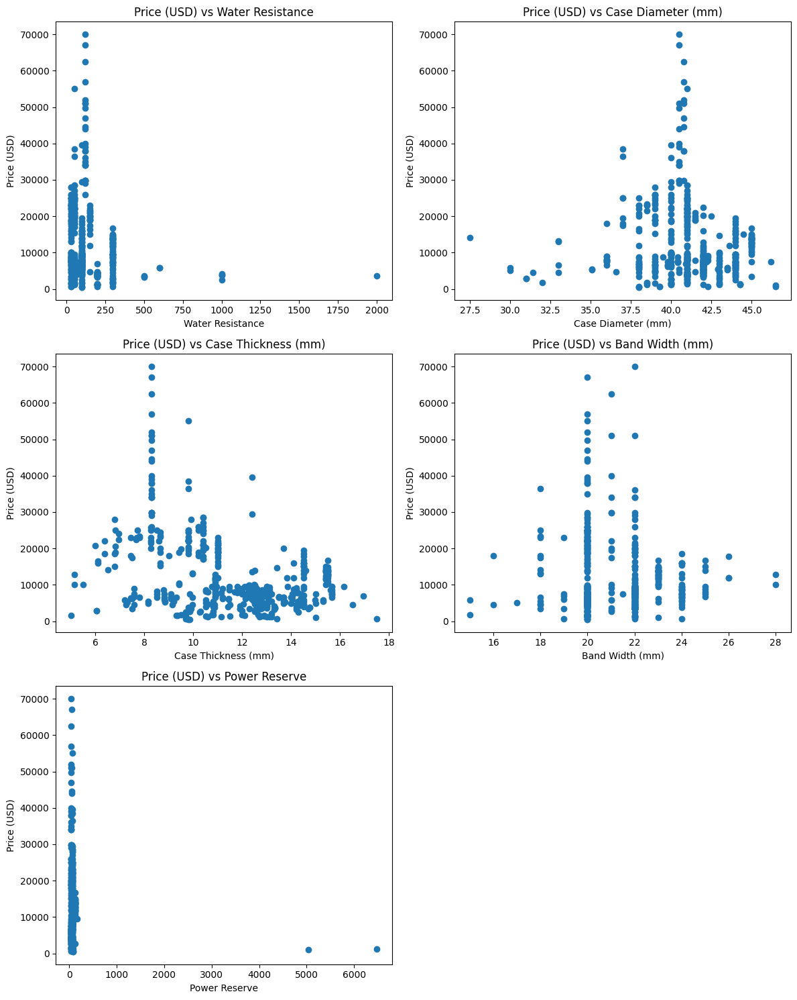

In [ ]:
columns = ['Water Resistance', 'Case Diameter (mm)', 'Case Thickness (mm)', 'Band Width (mm)', 'Power Reserve']


rows = 3
cols = 2

fig, axs = plt.subplots(rows, cols, figsize=(12, 5 * rows))

for i, colname in enumerate(columns):
    row = i // cols
    col = i % cols
    axs[row, col].scatter(watches_parsed_df[colname],watches_parsed_df['Price (USD)'])
    axs[row, col].set_ylabel('Price (USD)')
    axs[row, col].set_xlabel(colname)
    axs[row, col].set_title('Price (USD) vs ' + colname)

# Eliminamos la última gráfica
if rows*cols > len(columns):
    fig.delaxes(axs[-1, -1])

plt.tight_layout()
plt.show()

Ahora vamos a realizar diagramas de caja para las variables de tipo cualitativo, vamos a observar como se distribuyen:

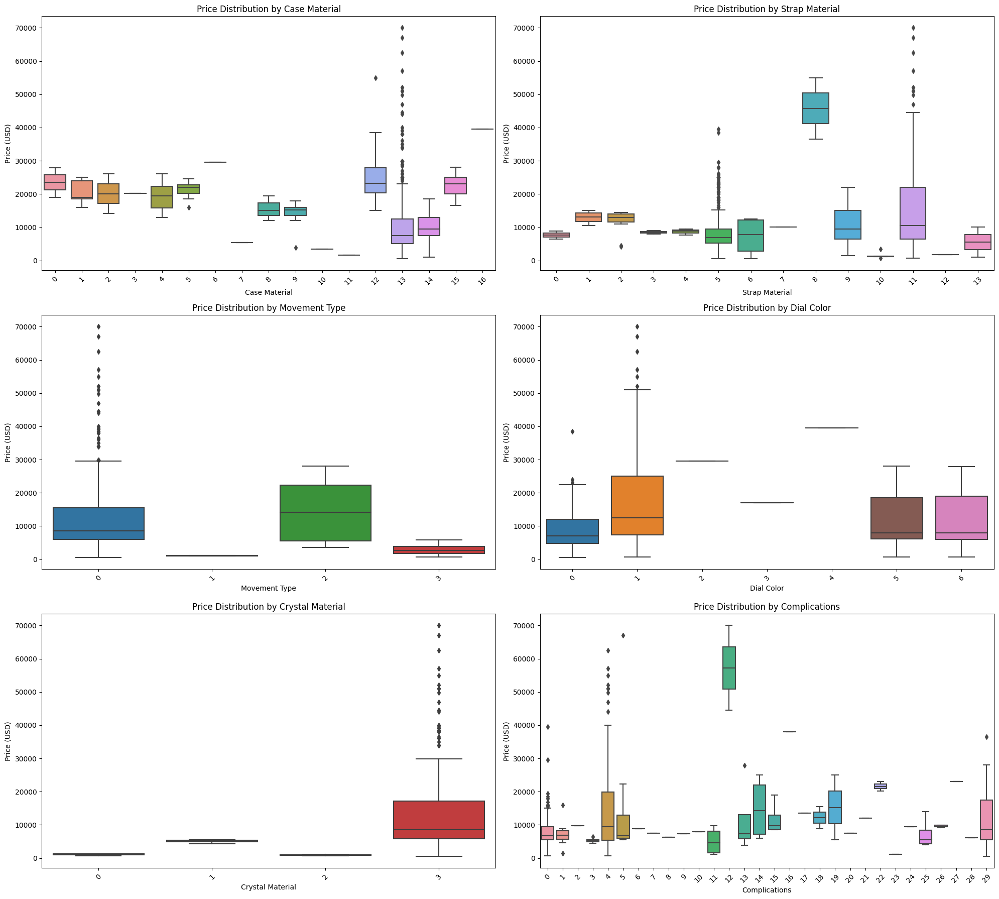

In [ ]:
categorical_columns = ['Case Material', 'Strap Material', 'Movement Type', 'Dial Color', 'Crystal Material', 'Complications']

fig, axes = plt.subplots(3, 2, figsize=(20, 18))

for col, ax in zip(categorical_columns, axes.flatten()):
    sns.boxplot(x=col, y='Price (USD)', data=watches_parsed_df, ax=ax)
    ax.set_title(f'Price Distribution by {col}')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Como podemos observar, las variables generalmente tienen poca correlación, pero nos fijaremos en las 3 variables que más correlación tienen con la variable respuesta, las cuales hemos visto en la matriz de correlación. Estas son las siguientes:
* Case Thickness (mm)
* Strap Material
* Case Material
* Crystal Material

Ya que, las demás, no aparentan aportar información relevante para ayudarnos a predecir la variable respuesta y, como hemos podido observar en los gráficos previos, multitud de los datos se solapan y no es posible obtener tendencias claras ni conclusiones fiables de los gráficos.

Por lo que ahora, vamos a quedarnos con las columnas que nos interesan de nuestro DataFrame:


In [ ]:
most_relevant_columns = list(correlation_with_price_sorted.head(4).index) + ["Price (USD)"]
watches_parsed_df = watches_parsed_df[most_relevant_columns]
watches_parsed_df.sample(3)

,Case Thickness (mm),Strap Material,Case Material,Crystal Material,Price (USD)
280,12.5000,11,13,3,6500.0000
386,15.5000,2,13,3,11000.0000
350,14.0000,5,13,3,4950.0000


#### Detección outliers
Vamos a realizar un estudio de detección de outliers, donde evaluaremos si eliminar o no los valores que consideremos como valores atípicos. Esto lo haremos para eliminar valores muy superiores o muy inferiores a la distribución de los datos. Estos valores, pueden confundir al modelo, y en algunas ocasiones, eliminar dichos outliers hace aumentar considerablemente la precisión del modelo. Por esto, vamos a mostrar los candidatos a valores atípicos, los cuales son marcados con color rojo en la siguiente figura:

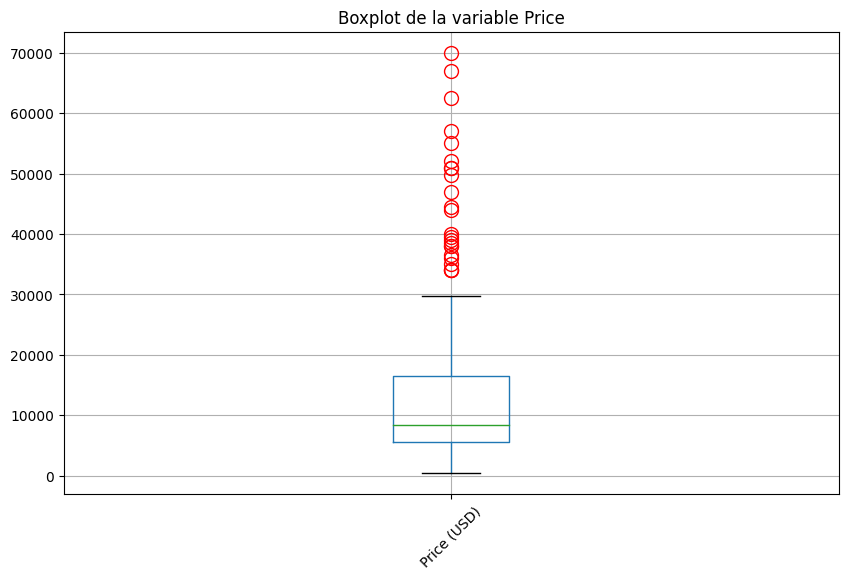

In [ ]:
plt.figure(figsize=(10, 6))
watches_parsed_df[['Price (USD)']].boxplot(flierprops={'marker':'o', 'markersize':10, 'markeredgecolor':'red'})
plt.title('Boxplot de la variable Price')
plt.xticks(rotation=45)
plt.show()


En dicho gráfico, el threshold o límite de tolerancia está establecido a 1.5, vamos a modificarlo a 3 y ver que registros concretos son considerados como valores atípicos, para esto, utilizamos el método del IQR:

In [ ]:
# Identificar valores atípicos usando el método de IQR
Q1 = watches_parsed_df['Price (USD)'].quantile(0.25)
Q3 = watches_parsed_df['Price (USD)'].quantile(0.75)

# Vamos a modificar el threshold a 3 para ser más permisivos
threshold = 3
IQR = Q3 - Q1

filtro_outliers = (watches_parsed_df['Price (USD)'] >= Q1 - threshold * IQR) & (watches_parsed_df['Price (USD)'] <= Q3 + threshold * IQR)
outliers_df = watches_parsed_df[~filtro_outliers]
watches_parsed_df_without_outliers = watches_parsed_df[filtro_outliers]
outliers_df

,Case Thickness (mm),Strap Material,Case Material,Crystal Material,Price (USD)
73,8.3000,11,13,3,49800.0000
106,9.8000,8,12,3,55000.0000
236,8.3000,11,13,3,51000.0000
252,8.3000,11,13,3,62500.0000
293,8.3000,11,13,3,70000.0000
309,8.3000,11,13,3,57000.0000
315,8.3000,11,13,3,51000.0000
359,8.3000,11,13,3,52000.0000
488,8.3000,11,13,3,67000.0000


Finalmente, se decide no eliminar dichos outliers, debido a la poca cantidad de datos que existe en el conjunto de datos por lo que, finalmente, nuestro dataset quedaría de la siguiente manera. Cabe destacar que si el dataset tuviera más registros, sería interesante evaluar la comparación de las tareas de regresión y clasificación eliminando los outliers y sin eliminarlos.

Mostramos de nuevo 5 filas del dataset con el que se va a trabajar:

In [ ]:
watches_parsed_df.sample(5)

,Case Thickness (mm),Strap Material,Case Material,Crystal Material,Price (USD)
248,13.0500,5,13,3,6400.0000
412,9.8000,11,13,3,22300.0000
443,10.4000,11,13,3,17000.0000
171,12.5000,3,13,3,8000.0000
450,10.9500,9,14,3,9500.0000


## Tareas de regresión
En este apartado, se va a proceder a realizar tareas de regresión para obtener un modelo que, dado un conjunto de variables, sea capaz de estimar el precio del reloj. Para ello, primero de todo vamos a dividir el conjunto de datos en conjunto de entrenamiento y conjunto de test, estableciendo un 80% para el entrenamiento.


In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(watches_parsed_df[watches_parsed_df.columns[:-1]], watches_parsed_df['Price (USD)'], test_size=0.2, random_state=0)
print(f"Tamaño del conjunto de train: {len(X_train)} elementos.\nTamaño del conjunto de test:  {len(X_test)} elementos.\n")

Tamaño del conjunto de train: 404 elementos.
Tamaño del conjunto de test:  102 elementos.



Una vez divididos los conjuntos entre entrenamiento y test, vamos a explorar distintos tipos de modelos para abordar la tarea de regresión. Dichos modelos serán evaluados y comparados a posteriori. Primero, vamos a establecer los modelos a probar y los parámetros a utilizar en la validación cruzada para la estimación de los mejores hiperparámetros por cada uno de los modelos, los cuales, son los siguientes:
* $Linear Regression$: Realiza una regresión lineal, buscando ajustar un hiperplano que minimice la suma de las diferencias cuadráticas entre las predicciones y los valores reales.
* $Ridge$: Es una regresión lineal con regularización L2. La regularización L2 penaliza los coeficientes grandes, evitando así el sobreajuste y mejorando la generalización del modelo en datos no vistos anteriormente.
* $Lasso$: Es una regresión lineal con regularización L1. A diferencia de Ridge, Lasso puede reducir algunos coeficientes exactamente a cero, realizando así una selección de características implícita y produciendo modelos más interpretables.
* $DecisionTreeRegressor$: Utiliza un árbol de decisión para realizar regresión. Los árboles de decisión dividen el espacio de características en regiones, buscando minimizar algún criterio de error dentro de cada región.
* $SVR (SVM)$: Es la versión de regresión de las Máquinas de Vectores de Soporte (SVM). Busca encontrar el hiperplano que mejor se ajusta a los datos dentro de un margen, siendo robusto frente a outliers.
* $KNN$: Estima el valor de una instancia basándose en los valores de las K instancias más cercanas en el espacio de características. Es un método no paramétrico y puede capturar relaciones no lineales.

En cuanto a los escaladres que se van a probar, son los siguientes:
* $StandardScaler$: Resta la media y divide por la desviación estándar para cada característica. El resultado es que las características se centran alrededor de cero con una varianza unitaria.
* $MinMaxScaler$: Escala y traslada cada característica individualmente de modo que quede en un rango dado en el conjunto de datos, típicamente entre cero y uno. Es útil cuando necesitas un rango limitado para tus características.
* $RobustScaler$: Resta la mediana y divide por el rango intercuartílico (IQR). A diferencia de StandardScaler, no se ve tan afectado por los outliers. Esto lo hace adecuado para datos con outliers.
* $Normalizer$: Escala las instancias individualmente a la norma unitaria (longitud vectorial de 1).

Ahora van a ser declarados en la siguiente celda:

In [ ]:
# Definimos modelos con Pipeline para poder usar Scalers y optimizar tanto los parámetros de
# los diferentes regresores como el Scaler a utilizar

## Modelos a evaluar
models = {
    'LinearRegression': Pipeline([
        ('scaler', StandardScaler()),
        ('regressor', LinearRegression())
    ]),
    'Ridge': Pipeline([
        ('scaler', StandardScaler()),
        ('regressor', Ridge())
    ]),
    'Lasso': Pipeline([
        ('scaler', StandardScaler()),
        ('regressor', Lasso())
    ]),
    'DecisionTreeRegressor': DecisionTreeRegressor(),
    'SVR': Pipeline([
        ('scaler', StandardScaler()),
        ('regressor', SVR())
    ]),
    "KNN": Pipeline([
        ('scaler', StandardScaler()),
        ('regressor', KNeighborsRegressor())
    ]),
}

# Hiperparámetros para GridSearchCV de cada uno de los modelos
params = {
    'Ridge': {
        'regressor__alpha': [0.1, 1.0, 10.0],
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()]
    },
    "Lasso": {
        'regressor__alpha': [0.1, 1.0, 10.0],
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()]
    },
    "DecisionTreeRegressor": {
        'max_depth': [None, 5, 10, 15, 30, 50]
    },
    "SVR": {
        'regressor__C': [0.1, 1, 10, 100],
        'regressor__epsilon': [0.1, 0.25, 0.5, 1],
        'regressor__kernel': ['linear', 'rbf', 'poly'],
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()]
    },
    "KNN": {
        'regressor__n_neighbors': [3, 5, 7, 9, 11, 13],
        'regressor__weights': ['uniform', 'distance'],
        'regressor__metric': ['euclidean', 'manhattan'],
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()]
    }
}

Una vez, se han definido los modelos e hiperparámetros a optimizar, procedemos a realizar la optimización de los mismos, quedandonos con el mejor de cada uno de los modelos:

In [ ]:
results = {}
models_results = {}

kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Iteramos sobre cada modelo
for name, model in models.items():
    print(f"Optimizando {name}...")

    # Filtramos los parámetros relevantes para el modelo actual a evaluar
    relevant_params = params.get(name, {})

    # Neg MSE, esto se debe a que GridSearchCV trata de maximizar siempre, por lo que, para minimizar el MSE
    # lo que tenemos que hacer es maximizar el -MSE
    grid_search = GridSearchCV(model, param_grid=relevant_params, cv=kf, n_jobs=-1, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, Y_train)

    # Guardamos el mejor estimador y su puntuación
    models_results[name] = grid_search.best_estimator_
    results[name] = -grid_search.best_score_


resultados = pd.DataFrame.from_dict(results, orient='index', columns=['Neg Mean Squared Error']).reset_index()
resultados.rename(columns={'index': 'Modelo'}, inplace=True)
resultados.sort_values(by="Neg Mean Squared Error", ascending=True, inplace=True)

# Los metemos en un Dataframe y mostramos
modelos = pd.DataFrame.from_dict(models_results, orient='index', columns=[ 'Objeto']).reset_index()
modelos.columns = ['Nombre del modelo', 'Objeto del modelo']
modelos

Optimizando LinearRegression...
Optimizando Ridge...
Optimizando Lasso...
Optimizando DecisionTreeRegressor...
Optimizando SVR...
Optimizando KNN...


,Nombre del modelo,Objeto del modelo
0,LinearRegression,"(StandardScaler(), LinearRegression())"
1,Ridge,"(Normalizer(), Ridge(alpha=0.1))"
2,Lasso,"(Normalizer(), Lasso())"
3,DecisionTreeRegressor,DecisionTreeRegressor(max_depth=50)
4,SVR,"(MinMaxScaler(), SVR(C=100, kernel='poly'))"
5,KNN,"(RobustScaler(), KNeighborsRegressor(metric='e..."


Donde, como se puede observar, para cada modelo, hemos obtenido la combinación de escalador, modelo e hiperparámetros del modelo que minimizan el error cuadrático medio. También destacar que, como podemos observar, no a todos los regresores les funciona igual de bien los distintos escaladores. Como se puede observar previamente, cada modelo posee un escalador (excepto $Ridge$ y $Lasso$ que repiten, debido a su naturaleza).

Una vez obtenido las pipelines optimas por cada uno de los modelos, vamos a realizar el entrenamiento de los mismos:


In [ ]:
models_trained = {}

for name, model in models_results.items():
    models_trained[name] = model.fit(X_train, Y_train)

#### Evaluación con conjunto de datos de Train

Una vez los modelos han sido entrenados, vamos a evaluarlos con el conjunto de datos de entrenamiento. Para la evaluación, nos vamos a basar en 3 métricas, las cuales son las siguientes

#### Mean Absolute Error (MAE)

El *Mean Absolute Error* (MAE) se calcula como el promedio de los errores absolutos entre las predicciones y los valores reales. Es una medida de cuán cerca están las predicciones de los valores reales.

$$
\text{MAE} = \frac{1}{n} \sum_{i=1}^{n} |y_i - \hat{y}_i|
$$

Donde:
- \(n\) es el número de observaciones,
- $y_i$ son los valores reales,
- $\hat{y}_i$ son los valores predichos.

#### Mean Squared Error (MSE)

El *Mean Squared Error* (MSE) se calcula como el promedio de los errores cuadrados entre las predicciones y los valores reales. Esta métrica penaliza más los errores grandes.

$$
\text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2
$$

#### Coeficiente de Determinación ($R^2$)

El coeficiente de determinación, conocido como \(R^2\), es una medida de cuán bien las predicciones se correlacionan con los valores reales. Un valor de \(R^2\) de 1 indica un ajuste perfecto.

$$
R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}
$$

Donde:
- $\bar{y}$ es el promedio de los valores reales $y_i$.


Por lo que, en la siguiente celda vamos a realizar el cálculo de las distintas métricas por cada uno de los modelos y, sus valores, serán expuestos en formato de tabla/dataframe:

In [ ]:
stats_train = {}

for name, model in models_trained.items():
    train_predictions = model.predict(X_train)

    # Calculo de las métricas
    mse = round(np.mean((train_predictions - Y_train) ** 2), 4)
    mae = round(np.mean(abs(train_predictions - Y_train)), 4)
    r2 = round(r2_score(Y_train, train_predictions), 4)  # Asegúrate de que Y_test sea el primer argumento

    # Almacenamos las métricas
    stats_train[name] = [mse, mae, r2]

# Añadimos nombre modelo a las estadisticas
data_to_frame = [(k,) + tuple(v) for k, v in stats_train.items()]

# Convertimos a DF y mostramos
resultados_train = pd.DataFrame(data_to_frame, columns=['Modelo', 'MSE en conjunto de Train', 'MAE en conjunto de Train', 'R^2 en conjunto de Train'])
resultados_train.sort_values(by='MSE en conjunto de Train', ascending=True, inplace=True)
resultados_train

,Modelo,MSE en conjunto de Train,MAE en conjunto de Train,R^2 en conjunto de Train
3,DecisionTreeRegressor,9988251.9814,1340.4506,0.9127
5,KNN,17178062.6513,2336.0891,0.8499
4,SVR,62822875.4126,4918.9841,0.4509
2,Lasso,81455597.0204,6459.1805,0.2880
1,Ridge,82139364.3103,6469.2884,0.2821
0,LinearRegression,87165130.7816,6691.2699,0.2381


Como podemos observar, el MSE proporciona valores muy grandes, pero esto se debe a la naturaleza de la métrica de elevar los errores al cuadrado. Por otro lado, podemos observar que modelos como $DecisionTreeRegressor$ y $KNN$ poseen un $R^2$ considerablemente elevado (mayor de 80%), por lo que se ajustan considerablemente bien a los datos. Tmabién tener en cuenta que estos dos modelos tienden bastante a ajustarse muy bien a los datos de entrenamiento, mientras que en ocasiones, en el conjunto de test no rinden tan bien, ya que no son capaces de generalizar tanto y se adaptan muy (y únicamente) al conjunto de entrenamiento. Vamos a evaluar ahora el conjunto de test, para observar el comportamiento de los modelos, realizando la misma operatoria que en el conjunto de datos de entrenamiento:

In [ ]:
stats_test = {}

for name, model in models_trained.items():
    test_predictions = model.predict(X_test)

    # Calculo de las métricas
    mse = round(np.mean((test_predictions - Y_test) ** 2), 4)
    mae = round(np.mean(abs(test_predictions - Y_test)), 4)
    r2 = round(r2_score(Y_test, test_predictions), 4)

    # Almacenamos las métricas
    stats_test[name] = [mse, mae, r2]

# Añadimos nombre modelo a las estadisticas
data_to_frame = [(k,) + tuple(v) for k, v in stats_test.items()]

# Convertimos a DF y mostramos
resultados_test = pd.DataFrame(data_to_frame, columns=['Modelo', 'MSE en conjunto de Test', 'MAE en conjunto de Test', 'R^2 en conjunto de Test'])
resultados_test.sort_values(by='MSE en conjunto de Test', ascending=True, inplace=True)
resultados_test

,Modelo,MSE en conjunto de Test,MAE en conjunto de Test,R^2 en conjunto de Test
3,DecisionTreeRegressor,21487424.2755,2897.2312,0.7432
5,KNN,23827369.5261,3031.7484,0.7152
0,LinearRegression,61554261.4864,5445.8102,0.2643
1,Ridge,62045634.8708,5517.2963,0.2585
2,Lasso,63369728.0066,5545.8137,0.2427
4,SVR,70822309.4783,5049.6006,0.1536


Como podemos observar, los mejores modelos siguen siendo los mismos que en el conjunto de entrenamiento, pero sus métricas han empeorado bastante. Sin embargo, los demás regresores se mantienen más o menos en las mismas medidas (aunque muy bajas).


Una vez obtenidas las métricas por cada modelo respectivas a cada uno de los conjuntos, vamos a comparar, por cada modelo, su MSE, MAE y $R^2$ en distintos gráficos:

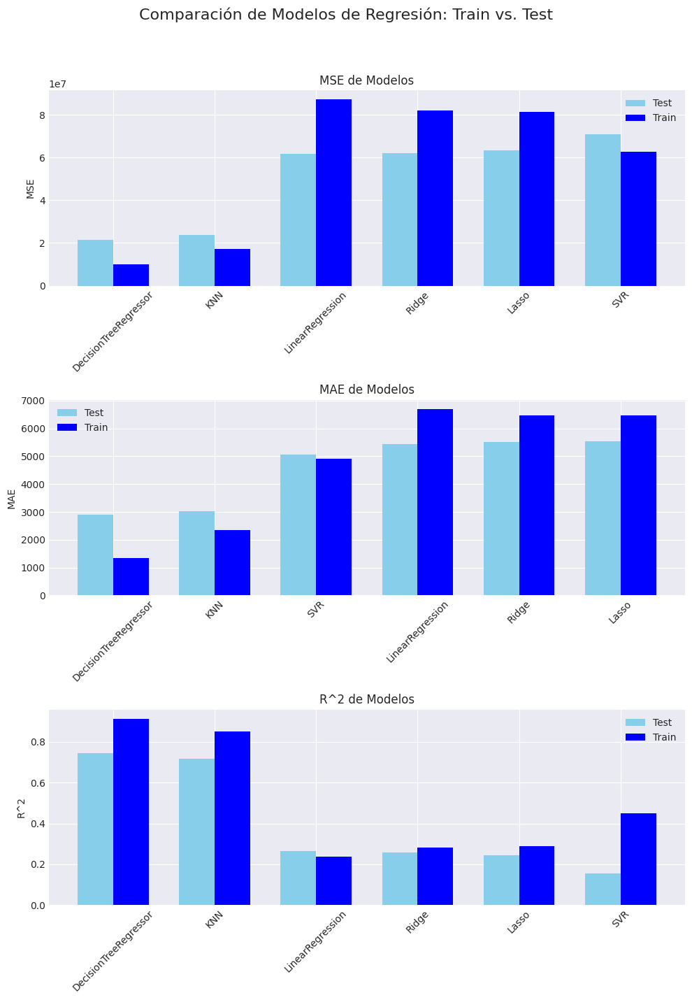

In [ ]:
# Unimos los dataframes por la columna común (modelo)
df = pd.merge(resultados_train, resultados_test, on=['Modelo'])

df_sorted = df.sort_values('MSE en conjunto de Test')

# Configuramos estilo
plt.style.use('seaborn-darkgrid')

fig, axes = plt.subplots(3, 1, figsize=(10, 15))
fig.suptitle('Comparación de Modelos de Regresión: Train vs. Test', fontsize=16)
bar_width = 0.35

# Índices de las barras actualizados según el df ordenado
index = np.arange(len(df_sorted['Modelo']))

# Actualizar los gráficos para usar 'df_sorted'
for metric, ax in zip(['MSE', 'MAE', 'R^2'], axes):
    # Ordenamos el DataFrame por la métrica correspondiente en el conjunto de test

    not_is_r2 = metric != 'R^2'
    df_sorted = df.sort_values(f"{metric} en conjunto de Test", ascending=not_is_r2)

    ax.bar(index - bar_width/2, df_sorted[f"{metric} en conjunto de Test"], bar_width, label='Test', color='skyblue')
    ax.bar(index + bar_width/2, df_sorted[f"{metric} en conjunto de Train"], bar_width, label='Train', color='blue')
    ax.set_title(f'{metric} de Modelos')
    ax.set_ylabel(metric)
    ax.set_xticks(index)
    ax.set_xticklabels(df_sorted['Modelo'], rotation=45)
    ax.legend()

# Ajustar layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Mostrar gráfico
plt.show()


Donde, como podemos observar, tanto el regresor $KNN$ como $DecisionTreeRegressor$ proporcionan buen ajuste a los datos y un error significativamente inferior a los demás regresores. Dado que $DecisionTreeRegressor$ se ajusta mejor a los datos y posee menos en error (tanto en MAE como en MSE), el regresor $DecisionTreeRegressor$ es el que mejor funciona con los datos proporcionados, de los que han sido evaluados en este cuaderno hasta este punto.

## Tareas de clasificación


Ahora vamos a realizar el mismo estudio, pero esta vez vamos a aplicar tareas de clasificación. Para ello, vamos a añadir una columna al dataset, que, en función del precio del reloj, pertenezca a una de las siguientes clases:
* Premium Base: Para relojes que representan el nivel de entrada al segmento de lujo (Valor inferior a 7000 USD).
* Premium: Para aquellos relojes que ofrecen un nivel de lujo y exclusividad superior, pero que no alcanzan el máximo nivel de exclusividad y precio (Valor entre 7.000 USD y 14.000 USD).
* Premium Exclusivo: Para relojes en el rango más alto de exclusividad y precio, representando piezas maestras de la relojería (Valor superior a 14.000 USD).

Con esta clasificación, buscamos encontrar un clasificador que sea capaz de estimar a que rango pertenece un reloj, en función de sus características.

Ahora, vamos a crear la columna $clase$, la cual contendrán las clases descritas anteriormente

In [ ]:
def classify_watch_by_price(price) -> str:
    if price < 7000:
        return "Premium Base"
    elif price > 14000:
        return "Premium Exclusivo"
    else:
        return "Premium"


watches_parsed_df_for_classification = watches_parsed_df.copy()
watches_parsed_df_for_classification['Clase'] = watches_parsed_df_for_classification['Price (USD)'].apply(classify_watch_by_price)
watches_parsed_df_for_classification.sample(3)

,Case Thickness (mm),Strap Material,Case Material,Crystal Material,Price (USD),Clase
383,12.7500,5,13,3,7500.0000,Premium
504,9.7000,5,13,3,1800.0000,Premium Base
181,12.8000,5,7,3,5300.0000,Premium Base


Una vez añadida la columna $Clase$ en función del precio, vamos a observar cuantas instancias de cada una de las 3 clases tenemos en nuestro conjunto

Total de instancias -> 506
Distribución de clases:
    Premium: 0.324
    Premium Base: 0.383
    Premium Exclusivo: 0.292
Categorías -> ['Premium', 'Premium Base', 'Premium Exclusivo']


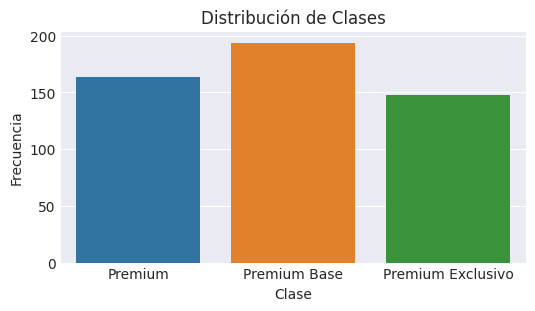

In [ ]:
class_col = 'Clase'


categories = sorted(watches_parsed_df_for_classification[class_col].unique(), reverse=False)
hist= Counter(watches_parsed_df_for_classification[class_col])

print(f'Total de instancias -> {watches_parsed_df_for_classification.shape[0]}')
print('Distribución de clases:')

for item in sorted(hist.items(), key=lambda x: x[0]): print(f'    {item[0]}: {round(item[1]/len(watches_parsed_df_for_classification[class_col]), 3)}')

print(f'Categorías -> {categories}')


plt.figure(figsize=(6, 3))
sns.countplot(data=watches_parsed_df_for_classification, x=class_col, order=categories)
plt.title('Distribución de Clases')
plt.xlabel('Clase')
plt.ylabel('Frecuencia')
plt.show()

Ahora vamos a realizar técnicas de balanceo de datos, para ello, vamos a realizar undersampling y oversampling, para obtener las mismas instancias de cada una de las clases:


In [ ]:
# Mezclamos todos los datos
data_original_suffled = shuffle(watches_parsed_df_for_classification, random_state=0)

# Creamos el objeto que servirá para realizar el undersampling fijando la semilla
rus = RandomUnderSampler(random_state=0, sampling_strategy='auto')
data_under_sampled, _ = rus.fit_resample(watches_parsed_df_for_classification, watches_parsed_df_for_classification[class_col])

data_under_sampled[class_col].value_counts()

Clase
Premium              148
Premium Base         148
Premium Exclusivo    148
Name: count, dtype: int64

En este caso, hemos realizado undersampling, es decir, hemos mantenido el mismo número de instancias por clase en las 3, igualandolas al valor mínimo de instancias entre las 3 clases. Para realizar esto, se recorta al nivel del número de instancias de la clase minoritaria.


Ahora vamos a realizar el oversampling:

In [ ]:
ros = RandomOverSampler(random_state=0)
data_over_sampled, _ = ros.fit_resample(watches_parsed_df_for_classification, watches_parsed_df_for_classification[class_col])

data_over_sampled[class_col].value_counts()

Clase
Premium              194
Premium Base         194
Premium Exclusivo    194
Name: count, dtype: int64

Donde, lo que se realiza es coger el número máximo de instancias por clase de la clase mayoritaria, y equiparar las otras clases realizando copias de datos existentes de las clases minoritarias (duplicando registros).

Ahora, procedemos a realizar la división de los conjuntos en train y test del conjunto original, para realizar las tareas de validación cruzada y obtener los parámetros óptimos de los modelos:

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(watches_parsed_df_for_classification[watches_parsed_df_for_classification.columns[:-2]], watches_parsed_df_for_classification['Clase'], test_size=0.2, random_state=0)
print(f"Tamaño del conjunto de train: {len(X_train)} elementos.\nTamaño del conjunto de test:  {len(X_test)} elementos.\n")

Tamaño del conjunto de train: 404 elementos.
Tamaño del conjunto de test:  102 elementos.



Y ahora vamos a definir los modelos a evaluar, junto con sus hiperparámetros a optimizar y los respectivos escaladores también utilizados en el apartado de regresión:

In [ ]:
# Hiperparámetros para GridSearchCV de cada uno de los modelos
# Modelos a evaluar
models = {
    'SVC_rbf': Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', SVC(kernel='rbf', probability=True, random_state=0))
    ]),
    'SVC_linear': Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', SVC(kernel='linear', probability=True, random_state=0))
    ]),
    'SVC_poly': Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', SVC(kernel='poly', probability=True, random_state=0))
    ]),
    'RandomForest': Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', RandomForestClassifier(n_jobs=-1, random_state=0))
    ]),
    'LogisticRegression': Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', LogisticRegression(n_jobs=-1, random_state=0))
    ]),
    'MultinomialNB': Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', MultinomialNB())
    ]),
    "BernoulliNB": Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', BernoulliNB())
    ]),
    "DecisionTree": Pipeline([
        ('classifier', DecisionTreeClassifier(random_state=0))
    ]),
    "XGBoost": Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=0))
    ]),
    "KNeighborsClassifier": Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', KNeighborsClassifier(n_jobs=-1))
    ])
}


# Parámetros para realizar la Cross-Validation
parameters_to_cross_validate = {
    'SVC_rbf': {
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()],
        'classifier__C': [0.1, 1, 10], 'classifier__gamma': [1, 0.1, 0.01]
    },
    'SVC_linear': {
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()],
        'classifier__C': [0.1, 1, 10]
    },
    'RandomForest': {
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()],
        'classifier__n_estimators': [10, 100, 1000], 'classifier__max_depth': [5, 10, 15]
    },
    'LogisticRegression': {
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()],
        'classifier__C': [0.1, 1, 10],
        'classifier__max_iter': [100, 500, 1000],
        'classifier__solver': ['lbfgs', 'saga', 'newton-cg'],

    },
    'MultinomialNB': {
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()],
        'classifier__alpha': [0.1, 1, 10]
    },
    'BernoulliNB': {
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()],
        'classifier__alpha': [0.1, 1, 10]
    },
    'DecisionTree': {
        'classifier__max_depth': [5, 10, 20]
    },
    'XGBoost': {
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()],
        'classifier__n_estimators': [100, 200], 'classifier__learning_rate': [0.01, 0.1]
    },
    'KNeighborsClassifier':{
        'scaler': [StandardScaler(), MinMaxScaler(), RobustScaler(), Normalizer()],
    }
}

Una vez definidos, procedemos con la validación cruzada:


In [ ]:
results = {}
models_results = {}



# Validación cruzada KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Iteramos sobre cada modelo
for name, model in models.items():
    print(f"Optimizando {name}...")

    # Filtramos los parámetros relevantes para el modelo actual a evaluar
    relevant_params = parameters_to_cross_validate.get(name, {})

    grid_search = GridSearchCV(model, param_grid=relevant_params, cv=kf, scoring='accuracy', n_jobs=-1)
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(Y_train)

    grid_search.fit(X_train, y_encoded)

    # Guardamos el mejor estimador y su puntuación
    models_results[name] = grid_search.best_estimator_
    results[name] = grid_search.best_score_


resultados = pd.DataFrame.from_dict(results, orient='index', columns=['Accuracy']).reset_index()
resultados.rename(columns={'index': 'Modelo'}, inplace=True)
resultados.sort_values(by="Accuracy", ascending=False, inplace=True)

# Los metemos en un Dataframe y mostramos
modelos_opt_clasificacion = pd.DataFrame.from_dict(models_results, orient='index', columns=[ 'Objeto']).reset_index()
modelos_opt_clasificacion.columns = ['Nombre del modelo', 'Objeto del modelo']
modelos_opt_clasificacion

Optimizando SVC_rbf...
Optimizando SVC_linear...
Optimizando SVC_poly...
Optimizando RandomForest...
Optimizando LogisticRegression...


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

Optimizando MultinomialNB...
Optimizando BernoulliNB...
Optimizando DecisionTree...
Optimizando XGBoost...
Optimizando KNeighborsClassifier...


,Nombre del modelo,Objeto del modelo
0,SVC_rbf,"(StandardScaler(), SVC(C=10, gamma=1, probabil..."
1,SVC_linear,"(Normalizer(), SVC(C=10, kernel='linear', prob..."
2,SVC_poly,"(StandardScaler(), SVC(kernel='poly', probabil..."
3,RandomForest,"(RobustScaler(), (DecisionTreeClassifier(max_d..."
4,LogisticRegression,"(RobustScaler(), LogisticRegression(C=0.1, n_j..."
5,MultinomialNB,"(MinMaxScaler(), MultinomialNB(alpha=0.1))"
6,BernoulliNB,"(StandardScaler(), BernoulliNB(alpha=0.1))"
7,DecisionTree,"(DecisionTreeClassifier(max_depth=20, random_s..."
8,XGBoost,"(StandardScaler(), XGBClassifier(base_score=No..."
9,KNeighborsClassifier,"(RobustScaler(), KNeighborsClassifier(n_jobs=-1))"


Ahora vamos a entrenar los modelos óptimos, pero antes, dividiremos los conjuntos de train y test para el undersampling y el oversampling. Posteriormente evaluaremos los modelos entrenados con cada uno de los conjuntos y obtendremos que combinación de modelo y conjunto otorga mejores resultados:

In [ ]:
models_trained = {}
models_trained_undersampled = {}
models_trained_oversampled = {}

label_encoder = LabelEncoder()

y_encoded = label_encoder.fit_transform(Y_train)

# Datos originales
for name, model in models_results.items():
    models_trained[name] = model.fit(X_train, y_encoded)

# Datos undersampled
X_train_undersampled, X_test_undersampled, Y_train_undersampled, Y_test_undersampled = train_test_split(data_under_sampled[data_under_sampled.columns[:-2]], data_under_sampled['Clase'], test_size=0.2, random_state=0)
y_encoded = label_encoder.fit_transform(Y_train_undersampled)

for name, model in models_results.items():
    models_trained_undersampled[name] = model.fit(X_train_undersampled, y_encoded)

print(f"[Undersampling]\nTamaño del conjunto de train: {len(X_train_undersampled)} elementos.\nTamaño del conjunto de test:  {len(X_test_undersampled)} elementos.\n")
# Datos oversampled
X_train_oversampled, X_test_oversampled, Y_train_oversampled, Y_test_oversampled = train_test_split(data_over_sampled[data_over_sampled.columns[:-2]], data_over_sampled['Clase'], test_size=0.2, random_state=0)
y_encoded = label_encoder.fit_transform(Y_train_oversampled)

for name, model in models_results.items():
    models_trained_oversampled[name] = model.fit(X_train_oversampled, y_encoded)

print(f"[Oversampling]\nTamaño del conjunto de train: {len(X_train_oversampled)} elementos.\nTamaño del conjunto de test:  {len(X_test_oversampled)} elementos.\n")

[Undersampling]
Tamaño del conjunto de train: 355 elementos.
Tamaño del conjunto de test:  89 elementos.

[Oversampling]
Tamaño del conjunto de train: 465 elementos.
Tamaño del conjunto de test:  117 elementos.



Ahora vamos a evaluar los modelos en el conjunto de entrenamiento:

In [ ]:
def evaluate_models(models_dict, X_train, Y_train, X_test, Y_test, label_encoder):
    stats_train = {}
    stats_test = {}

    # Codificación de etiquetas
    Y_test_encoded = label_encoder.transform(Y_test)
    Y_train_encoded = label_encoder.transform(Y_train)

    for name, model in models_dict.items():
        # Predicciones en el conjunto de entrenamiento
        train_predictions = model.predict(X_train)
        # Calculamos la precisión y el F1-Score para el conjunto de entrenamiento
        accuracy_train = accuracy_score(Y_train_encoded, train_predictions)
        f1_score_train = f1_score(Y_train_encoded, train_predictions, average='weighted')  # Utiliza 'weighted' para multiclase

        # Almacenamos la precisión y el F1-Score del conjunto de entrenamiento
        stats_train[name] = {'Accuracy': accuracy_train, 'F1-Score': f1_score_train}

        # Predicciones en el conjunto de prueba
        test_predictions = model.predict(X_test)
        # Calculamos la precisión y el F1-Score para el conjunto de prueba
        accuracy_test = accuracy_score(Y_test_encoded, test_predictions)
        f1_score_test = f1_score(Y_test_encoded, test_predictions, average='weighted')  # Utiliza 'weighted' para multiclase

        # Almacenamos la precisión y el F1-Score del conjunto de prueba
        stats_test[name] = {'Accuracy': accuracy_test, 'F1-Score': f1_score_test}

    # Convertimos los diccionarios a DataFrames
    resultados_train = pd.DataFrame.from_dict(stats_train, orient='index').reset_index().rename(columns={'index': 'Modelo'}).sort_values(by='Accuracy', ascending=False)
    resultados_test = pd.DataFrame.from_dict(stats_test, orient='index').reset_index().rename(columns={'index': 'Modelo'}).sort_values(by='Accuracy', ascending=False)

    return resultados_train, resultados_test


# Evaluar para datos originales
resultados_train_orig, resultados_test_orig = evaluate_models(models_trained, X_train, Y_train, X_test, Y_test, label_encoder)

# Evaluar para datos undersampled
resultados_train_under, resultados_test_under = evaluate_models(models_trained_undersampled, X_train_undersampled, Y_train_undersampled, X_test_undersampled,Y_test_undersampled, label_encoder)

# Evaluar para datos oversampled
resultados_train_over, resultados_test_over = evaluate_models(models_trained_oversampled, X_train_oversampled, Y_train_oversampled, X_test_oversampled, Y_test_oversampled, label_encoder)

Una vez tenemos todos los resultados por cada una de las estrategias, vamos a unificarlos en un único dataframe. Para ello, vamos a establecer una columna adicional denominada $DataStrategy$ que indicará el tipo de muestreo de datos que se ha empleado (dejándolos tal cual, undersampling u oversampling):

In [ ]:
# Establecemos columna que indica estrategia de muestreo
resultados_train_orig['DataStrategy'] = 'Original'
resultados_train_under['DataStrategy'] = 'Undersampling'
resultados_train_over['DataStrategy'] = 'Oversampling'
resultados_test_orig['DataStrategy'] = "Original"
resultados_test_under['DataStrategy'] = "Undersampling"
resultados_test_over['DataStrategy'] = "Oversampling"

# Unimos conjuntos de train y test
resultados_train = pd.concat([resultados_train_orig, resultados_train_under, resultados_train_over]).sort_values(by=['Accuracy'], ascending=False)
resultados_test = pd.concat([resultados_test_orig, resultados_test_under, resultados_test_over]).sort_values(by=['Accuracy'], ascending=False)


Una vez obtenidos los resultados, vamos a mostrar el accuracy del conjunto de entrenamiento por modelo:

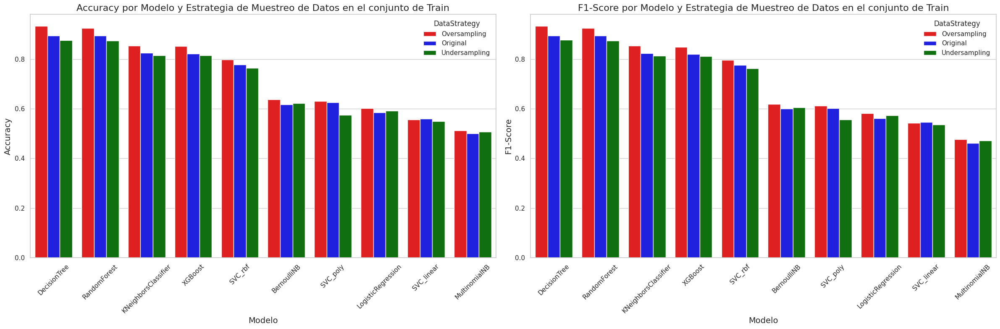

In [ ]:
sns.set(style="whitegrid")

palette_colors = {'Original': 'blue', 'Undersampling': 'green', 'Oversampling': 'red'}

# Crear figuras y ejes para dos subplots
fig, axes = plt.subplots(1, 2, figsize=(24, 8))

# Gráfica para Accuracy
sns.barplot(x='Modelo', y='Accuracy', hue='DataStrategy', data=resultados_train, palette=palette_colors, ax=axes[0])
axes[0].set_title('Accuracy por Modelo y Estrategia de Muestreo de Datos en el conjunto de Train', fontsize=16)
axes[0].set_xlabel('Modelo', fontsize=14)
axes[0].set_ylabel('Accuracy', fontsize=14)
axes[0].tick_params(axis='x', rotation=45)

# Gráfica para F1-Score
sns.barplot(x='Modelo', y='F1-Score', hue='DataStrategy', data=resultados_train, palette=palette_colors, ax=axes[1])
axes[1].set_title('F1-Score por Modelo y Estrategia de Muestreo de Datos en el conjunto de Train', fontsize=16)
axes[1].set_xlabel('Modelo', fontsize=14)
axes[1].set_ylabel('F1-Score', fontsize=14)
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

Donde, como podemos observar, en ambos dos el árbol de decisión es el que mejor resultados ofrece. Este resultado era esperado, ya que generalmente, los árboles de decisión o soluciones basadas en árboles, se ajustan bastante bien al conjunto de entrenamiento. Sin embargo, vamos a evaluar ahora el conjunto de test:

In [ ]:
resultados_test.head(10)

,Modelo,Accuracy,F1-Score,DataStrategy
3,RandomForest,0.9213,0.9215,Undersampling
7,DecisionTree,0.9101,0.9091,Undersampling
8,XGBoost,0.8652,0.8607,Undersampling
3,RandomForest,0.8529,0.8538,Original
8,XGBoost,0.8529,0.8491,Original
7,DecisionTree,0.8529,0.8524,Original
9,KNeighborsClassifier,0.8090,0.8083,Undersampling
9,KNeighborsClassifier,0.8039,0.8048,Original
0,SVC_rbf,0.7865,0.7801,Undersampling
3,RandomForest,0.7863,0.7873,Oversampling


A diferencia de lo esperado, los 3 mejores clasificadores son aplicando el método de muestreo $Undersampling$, al contrario de lo esperado, con menos muestras, pero equilibradas, conseguimos mejores resultados en el clasificador. Esto sucede ya que conseguimos que los clasificadores consigan generalizar mejor y clasificar mejor las instancias que previamente no ha visto.

Como podemos observar, tanto $RandomForest$ como $DecisionTree$ poseen valores muy próximos de $Accuracy$, sin embargo el algoritmo de $RandomForest$ posee un valor más elevado de la métrica $F1\ Score$, y también de $Accuracy$, vamos a mostrarlo en forma de gráfica:

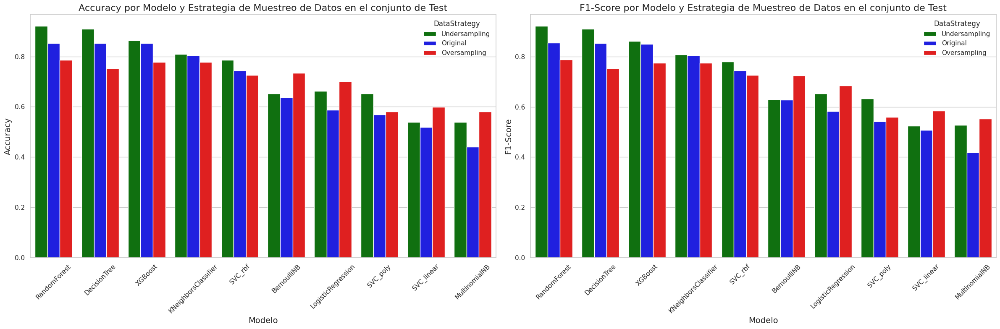

In [ ]:
sns.set(style="whitegrid")

palette_colors = {'Original': 'blue', 'Undersampling': 'green', 'Oversampling': 'red'}

# Crear figuras y ejes para dos subplots
fig, axes = plt.subplots(1, 2, figsize=(24, 8))

# Gráfica para Accuracy
sns.barplot(x='Modelo', y='Accuracy', hue='DataStrategy', data=resultados_test, palette=palette_colors, ax=axes[0])
axes[0].set_title('Accuracy por Modelo y Estrategia de Muestreo de Datos en el conjunto de Test', fontsize=16)
axes[0].set_xlabel('Modelo', fontsize=14)
axes[0].set_ylabel('Accuracy', fontsize=14)
axes[0].tick_params(axis='x', rotation=45)

# Gráfica para F1-Score
sns.barplot(x='Modelo', y='F1-Score', hue='DataStrategy', data=resultados_test.sort_values(by=['F1-Score'], ascending=False), palette=palette_colors, ax=axes[1])
axes[1].set_title('F1-Score por Modelo y Estrategia de Muestreo de Datos en el conjunto de Test', fontsize=16)
axes[1].set_xlabel('Modelo', fontsize=14)
axes[1].set_ylabel('F1-Score', fontsize=14)
axes[1].tick_params(axis='x', rotation=45)


plt.tight_layout()
plt.show()

Por lo que, vamos a visualizar a los dos mejores clasificadores, tanto el $DecisionTree$ como el $RandomForest$, a pesar de que finalmente, nos decantemos por $RandomForest$ debido a sus mejores resultados. Destacar que ambos clasificadores son generados con el tipo de muestreo $Undersampling$, permitiendo así generalizar más.
Destacar que el $RandomForest$ se ha combinado con el escalador $RobustSacler$ como se expone previamente en el apartado de optimización de los modelos.

#### DecisionTree
Vamos a visualizar la estructura del mejor clasificador obtenido, además de como se estructura dicho árbol óptimo del clasificador $DecisionTree$

In [ ]:
plt.figure(figsize=(200,60))
class_names = watches_parsed_df_for_classification[class_col].unique()

decision_tree_model = models_trained_undersampled['DecisionTree'].named_steps['classifier']

plot_tree(decision_tree_model, filled=True, feature_names=X_train_undersampled.columns, class_names=class_names, rounded=True, proportion=False, precision=2)
plt.show()


Donde, como podemos observar, nuestro árbol de decisión es considerablemente grande, con un total de profundidad de 19. Este es el modelo óptimo obtenido para este clasificador. Por último, vamos a evaluar la matriz de confusión de dicho clasificador, la cual es la siguiente:


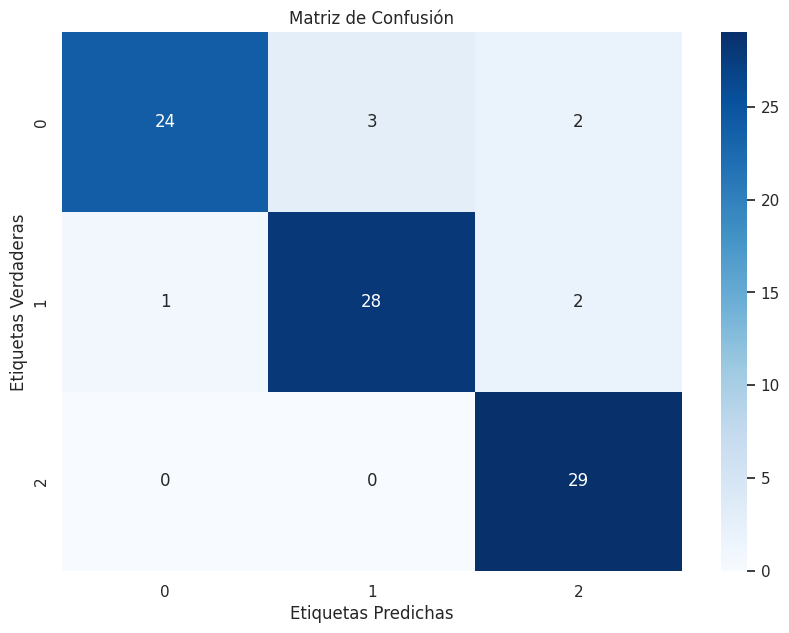

In [ ]:
# Matriz de confusión

y_pred = models_trained_undersampled['DecisionTree'].predict(X_test_undersampled)
y_true = label_encoder.transform(Y_test_undersampled)


cm = confusion_matrix(y_true, y_pred)


labels = unique_labels(y_true, y_pred)


plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Etiquetas Predichas')
plt.ylabel('Etiquetas Verdaderas')
plt.title('Matriz de Confusión')

plt.show()

Donde, como podemos observar, donde más se confunde es en las etiquetas que realmente son 0, estas son clasificadas en 3 ocasiones como 1 y otras 2 como 2.

#### RandomForest
Por último, vamos a visualizar la estructura del mejor clasificador obtenido, el cual es $RandomForest$, de este, vamos a seleccionar uno de los árboles del bosque para visualizar, ya que un bosque aleatorio consta de muchos árboles de decisión. La librería scikit-learn permite acceder a los árboles individuales dentro de un objeto $RandomForestClassifier$ mediante el atributo $estimators\_$:

In [ ]:
plt.figure(figsize=(200,60))
class_names = watches_parsed_df_for_classification[class_col].unique()

decision_tree_model = models_trained_undersampled['RandomForest'].named_steps['classifier']

# Seleccionamos un árbol específico del bosque aleatorio
single_tree = decision_tree_model.estimators_[0]

plot_tree(single_tree, filled=True, feature_names=X_train_undersampled.columns, class_names=class_names, rounded=True, proportion=False, precision=2)
plt.show()

Y ahora vamos a evaluar su matriz de confusión:

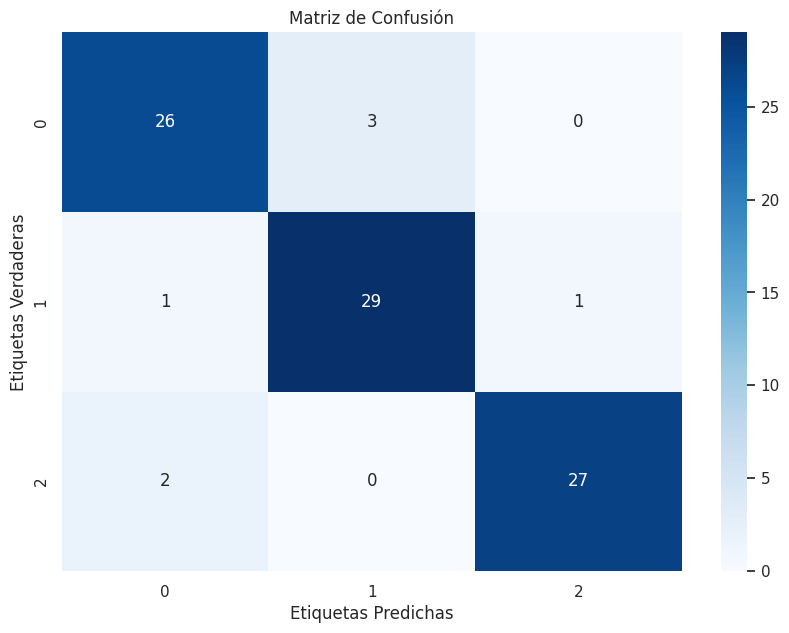

In [ ]:
# Matriz de confusión

y_pred = models_trained_undersampled['RandomForest'].predict(X_test_undersampled)
y_true = label_encoder.transform(Y_test_undersampled)


cm = confusion_matrix(y_true, y_pred)


labels = unique_labels(y_true, y_pred)


plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Etiquetas Predichas')
plt.ylabel('Etiquetas Verdaderas')
plt.title('Matriz de Confusión')

plt.show()

Donde, como podemos observar, $RandomForest$ acierta en una instancia más que el $DecisionTree$. Por lo que en cuanto a clasificación respecta, el modelo expuesto de $RandomForest$ es el óptimo para el problema de clasificación planteado entre los distintos modelos evaluados.

# Parte 2: Ensembles y Clustering



## Ensembles

Los ensembles son métodos en aprendizaje automático que combinan las predicciones de múltiples modelos para mejorar la robustez y precisión del resultado final. Estos métodos intentan construir un conjunto de modelos que, juntos, son más fuertes y fiables que individualmente. Los Ensembles que va a ser utilizados son los siguientes:

* Gradient Boosting: Método de ensemble que construye el modelo de forma secuencial, añadiendo predictores que corrigen sus predecesores. En cada paso, el algoritmo ajusta nuevos modelos a los errores residuales cometidos por los modelos anteriores y los combina para obtener la predicción final.
* Adaboost: Este ensemble ajusta secuencialmente una serie de modelos débiles, típicamente árboles de decisión. AdaBoost ajusta cada predictor sucesivo dando más peso a las instancias que fueron mal clasificadas por el predictor anterior, intentando así mejorar continuamente el rendimiento en los casos más difíciles.
* Bagging: Este ensemble entrena cada modelo en el ensemble de forma independiente usando un subconjunto aleatorio del conjunto de datos de entrenamiento. Posteriormente, las predicciones individuales se combinan mediante métodos estadísticos, como el promedio o la votación mayoritaria, para formar la predicción final.
* Stacking: Es un método de ensemble que considera las predicciones de varios modelos para alimentar a un modelo final que realiza la predicción final.

Ahora, vamos a definir los modelos de clasificación a utilzar:

In [ ]:
classifiers = [pipeline.named_steps['classifier'] for pipeline in list(modelos_opt_clasificacion['Objeto del modelo'])]
classifier_names_updated = [
    "svc_rbf", "svc_linear",
    "svc_poly", "random_forest", "logistic_regression",
    "bernoulli_nb", "decision_tree", "xgboost", "kneighbors"
]
classifiers = [clf for clf in classifiers if not isinstance(clf, MultinomialNB)]

classifiers_with_names = list(zip(classifier_names_updated, classifiers))
classifiers

[SVC(C=10, gamma=1, probability=True, random_state=0),
 SVC(C=10, kernel='linear', probability=True, random_state=0),
 SVC(kernel='poly', probability=True, random_state=0),
 RandomForestClassifier(max_depth=15, n_estimators=10, n_jobs=-1, random_state=0),
 LogisticRegression(C=0.1, n_jobs=-1, random_state=0),
 BernoulliNB(alpha=0.1),
 DecisionTreeClassifier(max_depth=20, random_state=0),
 XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric='logloss',
               feature_types=None, gamma=None, grow_policy=None,
               importance_type=None, interaction_constraints=None,
               learning_rate=0.01, max_bin=None, max_cat_threshold=None,
               max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
               max_leaves=None, min_child_weight=None, missin

Y ahora vamos a definir, en sí a los ensembles. A su vez, también vamos a definir los distintos hiperparámetros para realizar validación cruzada y optimizarlos para obtener el mejor resultado posible.

In [ ]:
## Modelos a evaluar
num_models = 10
models = {
    'GradientBoost': Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', GradientBoostingClassifier(n_estimators=num_models, learning_rate=0.8, random_state=0))
    ]),
    'AdaBoost': Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', AdaBoostClassifier(n_estimators=num_models))
    ]),
    'Bagging': Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', BaggingClassifier(
            n_estimators=num_models, max_samples=0.5, max_features=0.5, random_state=0))
    ]),
    'Stacking': Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', StackingClassifier(
            estimators=classifiers_with_names,
            final_estimator=LogisticRegression(),cv=5))
    ])
}

# Hiperparámetros para GridSearchCV de cada uno de los modelos
parameters_to_cross_validate = {
    'GradientBoost': {
        'classifier__n_estimators': [10, 50, 100],
        'classifier__learning_rate': [0.01, 0.1, 0.5, 1.0],
        'scaler': [StandardScaler(), MinMaxScaler()]
    },
    'AdaBoost': {
        'classifier__n_estimators': [1,5,10],
        'classifier__estimator': classifiers,
        'scaler': [StandardScaler(), MinMaxScaler()]
    },
    'Bagging': {
        'classifier__n_estimators': [5,10],
        'classifier__max_samples': [0.5, 0.75, 1.0],
        'classifier__estimator': classifiers,
        'scaler': [StandardScaler(), MinMaxScaler()]
    },
    'Stacking': {
        'scaler': [StandardScaler(), MinMaxScaler()]
    }
}

Una vez definidos, dividimos en conjunto de test y de train los datos:

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(watches_parsed_df_for_classification[watches_parsed_df_for_classification.columns[:-2]], watches_parsed_df_for_classification['Clase'], test_size=0.2, random_state=0)


Una vez dividido en dos subconjuntos, realizamos la validación cruzada para obtener los mejores clasificadores como ensembles:

In [ ]:
results = {}
models_results = {}

kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Iteramos sobre cada modelo
for name, model in models.items():
    print(f"Optimizando {name}...")

    # Filtramos los parámetros relevantes para el modelo actual a evaluar
    relevant_params = parameters_to_cross_validate.get(name, {})

    grid_search = GridSearchCV(model, param_grid=relevant_params, cv=kf, scoring='accuracy', n_jobs=-1)
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(Y_train)

    grid_search.fit(X_train, y_encoded)

    # Guardamos el mejor estimador y su puntuación
    models_results[name] = grid_search.best_estimator_
    results[name] = grid_search.best_score_


resultados = pd.DataFrame.from_dict(results, orient='index', columns=['Accuracy']).reset_index()
resultados.rename(columns={'index': 'Modelo'}, inplace=True)
resultados.sort_values(by="Accuracy", ascending=False, inplace=True)

# Los metemos en un Dataframe y mostramos
modelos = pd.DataFrame.from_dict(models_results, orient='index', columns=[ 'Objeto']).reset_index()
modelos.columns = ['Nombre del modelo', 'Objeto del modelo']
modelos_trained = {}

# Entrenamos los modelos óptimos
for name, model in models_results.items():
    modelos_trained[name] = model.fit(X_train, label_encoder.fit_transform(Y_train))


modelos

Optimizando GradientBoost...
Optimizando AdaBoost...
Optimizando Bagging...
Optimizando Stacking...


,Nombre del modelo,Objeto del modelo
0,GradientBoost,"(StandardScaler(), ([DecisionTreeRegressor(cri..."
1,AdaBoost,"(MinMaxScaler(), ((DecisionTreeClassifier(max_..."
2,Bagging,"(StandardScaler(), (XGBClassifier(base_score=N..."
3,Stacking,"(MinMaxScaler(), StackingClassifier(cv=5,\n ..."


Con esto ya hemos obtenido los mejores Ensembles, con la mejor combinación de sus hiperparámetros. Ahora, vamos a evaluarlos y obtener, para cada uno, su precisión y F1Score en el conjunto de entrenamiento y test:

In [ ]:
y_tr_encoded = label_encoder.fit_transform(Y_train)
y_tst_encoded = label_encoder.transform(Y_test)

all_metrics = []

for name, model in modelos_trained.items():
    print(f"\nEvaluación del modelo {name}\n---------------------------------")

    # Predicciones
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculamos accuracy y F1 para entrenamiento y prueba
    train_acc = accuracy_score(y_tr_encoded, y_train_pred)
    test_acc = accuracy_score(y_tst_encoded, y_test_pred)
    train_f1 = f1_score(y_tr_encoded, y_train_pred, average='weighted')
    test_f1 = f1_score(y_tst_encoded, y_test_pred, average='weighted')

    # Almacenamos métricas
    all_metrics.append({
        'Modelo': name,
        'Accuracy_Train': train_acc,
        'Accuracy_Test': test_acc,
        'F1_Score_Train': train_f1,
        'F1_Score_Test': test_f1
    })


    print(f'{name} train accuracy: {train_acc:.1%}, train F1 Score: {train_f1:.2f}')
    print(f'{name} test accuracy: {test_acc:.1%}, test F1 Score: {test_f1:.2f}')

# Creamos un DataFrame con todas las métricas
df_metrics = pd.DataFrame(all_metrics)

# Mostrar el DataFrame combinado
print("\nMétricas combinadas de entrenamiento y prueba:")
df_metrics.sort_values(by=['Accuracy_Test'],ascending=False)



Evaluación del modelo GradientBoost
---------------------------------
GradientBoost train accuracy: 86.4%, train F1 Score: 0.86
GradientBoost test accuracy: 75.5%, test F1 Score: 0.75

Evaluación del modelo AdaBoost
---------------------------------
AdaBoost train accuracy: 91.6%, train F1 Score: 0.92
AdaBoost test accuracy: 78.4%, test F1 Score: 0.78

Evaluación del modelo Bagging
---------------------------------
Bagging train accuracy: 83.2%, train F1 Score: 0.83
Bagging test accuracy: 76.5%, test F1 Score: 0.76

Evaluación del modelo Stacking
---------------------------------
Stacking train accuracy: 91.3%, train F1 Score: 0.91
Stacking test accuracy: 75.5%, test F1 Score: 0.75

Métricas combinadas de entrenamiento y prueba:


,Modelo,Accuracy_Train,Accuracy_Test,F1_Score_Train,F1_Score_Test
1,AdaBoost,0.9158,0.7843,0.9164,0.7826
2,Bagging,0.8317,0.7647,0.8321,0.7637
0,GradientBoost,0.8639,0.7549,0.8635,0.7511
3,Stacking,0.9134,0.7549,0.9129,0.7493


Ahora, vamos a visualizar lo anterior pero, esta vez, en formato gráfico que es más fácilmente interpretable:

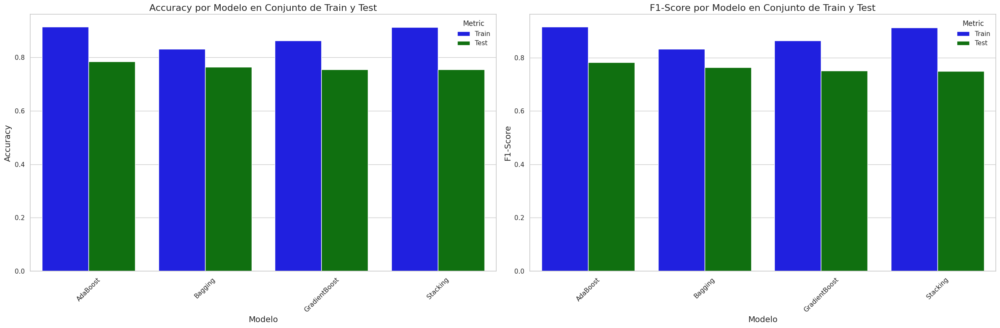

In [ ]:
palette_colors = {'Train': 'blue', 'Test': 'green'}

# Accuracy
df_long_accuracy = pd.melt(df_metrics, id_vars='Modelo', value_vars=['Accuracy_Train', 'Accuracy_Test'], var_name='Metric', value_name='Value')
df_long_accuracy['Metric'] = df_long_accuracy['Metric'].replace({'Accuracy_Train': 'Train', 'Accuracy_Test': 'Test'})
test_accuracy_order = df_long_accuracy[df_long_accuracy['Metric'] == 'Test'].sort_values(by='Value', ascending=False)['Modelo'].unique()

# F1-Score
df_long_f1 = pd.melt(df_metrics, id_vars='Modelo', value_vars=['F1_Score_Train', 'F1_Score_Test'], var_name='Metric', value_name='Value')
df_long_f1['Metric'] = df_long_f1['Metric'].replace({'F1_Score_Train': 'Train', 'F1_Score_Test': 'Test'})
test_f1_order = df_long_f1[df_long_f1['Metric'] == 'Test'].sort_values(by='Value', ascending=False)['Modelo'].unique()

fig, axes = plt.subplots(1, 2, figsize=(24, 8))

sns.barplot(x='Modelo', y='Value', hue='Metric', data=df_long_accuracy, palette=palette_colors, order=test_accuracy_order, ax=axes[0])
axes[0].set_title('Accuracy por Modelo en Conjunto de Train y Test', fontsize=16)
axes[0].set_xlabel('Modelo', fontsize=14)
axes[0].set_ylabel('Accuracy', fontsize=14)
axes[0].tick_params(axis='x', rotation=45)

sns.barplot(x='Modelo', y='Value', hue='Metric', data=df_long_f1, palette=palette_colors, order=test_f1_order, ax=axes[1])
axes[1].set_title('F1-Score por Modelo en Conjunto de Train y Test', fontsize=16)
axes[1].set_xlabel('Modelo', fontsize=14)
axes[1].set_ylabel('F1-Score', fontsize=14)
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Como podemos observar, en cuanto a ensembles, el método que mejores resultados proporciona es el $Adaboost$, tanto a nivel de F1-Score como de $Accuracy_{test}$.

Destacar que obtiene una precision de casi el 80%, lo cual es bastante considerable, aunque con los métodos descritos anteriormente en las tareas de clasificación obteníamos resultados algo mejores con los algoritmos $DecisionTree$ y $RandomForest$.

Por otro lado destacar también que las métricas en el conjunto de test, tanto a nivel de $F1$ como de $Accuracy$ son bastante similares, siendo el orden de mejor a peor:
1. AdaBoost
2. Bagging
3. GradientBoost
4. Stacking

Seleccionando finalmente $AdaBoost$, ya que es el $Ensemble$ que mejor rendimiento nos ha proporcionado tanto a nivel de $F1$ como de $Accuracy$

## Clustering
Ahora vamos a hacer clustering, donde intentaremos establecer 3 clusters bien diferenciados, para intentar dividir en las 3 clases que hemos diferenciado anteriormente:
* Premium Base: Para relojes que representan el nivel de entrada al segmento de lujo (Valor inferior a 7000 USD).
* Premium: Para aquellos relojes que ofrecen un nivel de lujo y exclusividad superior, pero que no alcanzan el máximo nivel de exclusividad y precio (Valor entre 7.000 USD y 14.000 USD).
* Premium Exclusivo: Para relojes en el rango más alto de exclusividad y precio, representando piezas maestras de la relojería (Valor superior a 14.000 USD).

Mostramos por tanto, 5 filas del dataframe del que partimos

In [ ]:
watches_parsed_df_for_classification.sample(5)

,Case Thickness (mm),Strap Material,Case Material,Crystal Material,Price (USD),Clase
93,17.5000,11,13,2,650.0000,Premium Base
496,13.1000,10,13,0,1200.0000,Premium Base
104,14.3000,9,13,3,2500.0000,Premium Base
174,10.8000,11,13,3,1800.0000,Premium Base
123,6.7900,5,1,3,18500.0000,Premium Exclusivo


Pero primero, vamos a definir que es el clsutering.
El clustering es una técnica de aprendizaje automático utilizada en análisis de datos para agrupar objetos o elementos similares en clusters. Exploraremos esta técnica aplicando diversos algoritmos aplicandolos al dataset de este cuaderno, es decir, al mostrado anteriormente.
Los algoritmos que se van a explorar son los siguientes:
* $KMeans$: Este popular algoritmo agrupa datos en K grupos distintos mediante una asignación iterativa de cada punto de datos al cluster más cercano, seguido de la recalculación de los centroides de cada cluster. Este proceso continúa hasta que los cambios en los centroides son mínimos o se alcanza el número máximo de iteraciones.
* $BIRCH$: Diseñado para grandes conjuntos de datos, este algoritmo construye una estructura de árbol jerárquico y emplea un esquema de clustering en dos fases para compactar los datos antes de agruparlos en la estructura jerárquica.
* $DBSCAN$: Agrupa los puntos de datos basándose en la densidad de los vecinos de cada punto. Es capaz de identificar clusters con formas arbitrarias y manejar efectivamente los datos con ruido, diferenciando regiones de alta y baja densidad.
* $Optics$: Extensión de DB-SCAN que proporciona un ordenamiento de puntos que revela la estructura de densidad de los datos a diversas escalas, facilitando la identificación de clusters de varios tamaños y formas.
* $AgglomerativeClustering$ con $Ward$: Método aglomerativo que minimiza la varianza dentro de los clusters al fusionarlos. Elige fusionar aquellos clusters cuya combinación resulte en el menor aumento de la varianza total.
* $Agglomerative Clustering$ con $Average$: Técnica de clustering jerárquico que inicia con cada punto como un cluster individual y fusiona progresivamente hasta alcanzar el número óptimo de clusters con la evaluando la distancia media entre las instancias del mismo. Permite visualizar la estructura jerárquica de los datos mediante dendrogramas.
* $Gaussian Mixture$: Algoritmo de clustering probabilístico que presupone que los datos provienen de varias distribuciones gaussianas. Utiliza el algoritmo Expectation-Maximization (EM) para estimar los parámetros de estas distribuciones y asignar puntos a clusters basándose en la probabilidad posterior.

Antes de empezar con la declaración de los algoritmos a nivel de código, vamos a ver, en el dataset original, la distribución en los 3 tipos de clases que hay.

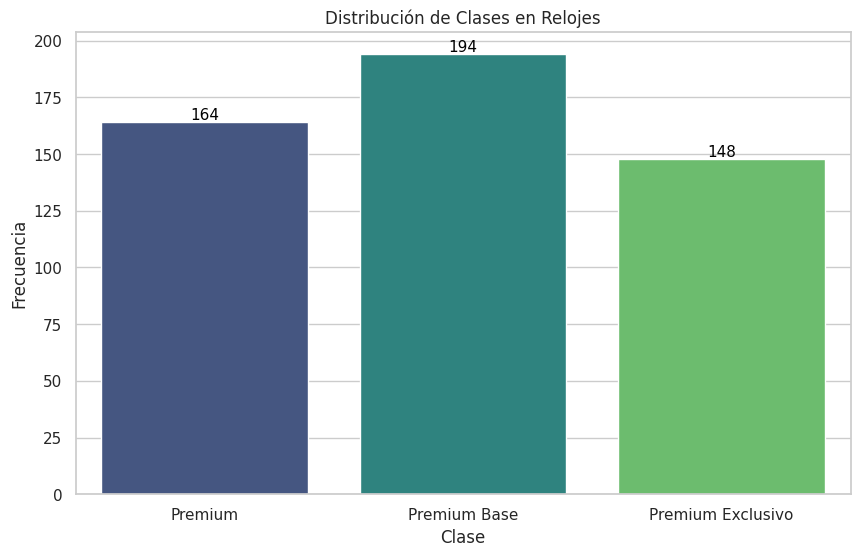

In [ ]:
sns.set(style="whitegrid")


plt.figure(figsize=(10, 6))
ax = sns.countplot(x='Clase', data=watches_parsed_df_for_classification, palette='viridis')

plt.title('Distribución de Clases en Relojes')
plt.xlabel('Clase')
plt.ylabel('Frecuencia')

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=11, color='black', xytext=(0, 5), textcoords='offset points')

plt.show()

Donde, como podemos ver, existen 3 conjuntos que más o menos están equilibrados, basándonos en el precio.

Ahora, vamos a definir los algoritmos:

In [ ]:
# Codigo original en el que me he basado en: https://github.com/davidogm/DataScience/blob/main/datamining/EjemplosClustering/data_mining_clustering.ipynb


# Obtenemos los datos, eliminando las columnas relacionadas con el precio y escalamos los datos
X = watches_parsed_df_for_classification.copy()[watches_parsed_df.columns[:-2]]
X = StandardScaler().fit_transform(X)

params = {
    'quantile': .3,
    'eps': .3,
    'damping': .9,
    'preference': -200,
    'n_neighbors': 10,
    'n_clusters': 3,
    'min_samples': 20,
    'xi': 0.05,
    'min_cluster_size': 0.1
}

# Definimos los algoritmos a evaluar
three_means = cluster.MiniBatchKMeans(n_clusters=params['n_clusters'], random_state=0, n_init='auto')


# connectivity matrix for structured Ward
connectivity = kneighbors_graph(
    X, n_neighbors=params['n_neighbors'], include_self=False)

# AgglomerativeClustering con tipo de linkage ward
ward = cluster.AgglomerativeClustering(
    n_clusters=params['n_clusters'],
    linkage='ward',
    connectivity=connectivity
)

# AgglomerativeClustering con tipo de linkage average
average_linkage = cluster.AgglomerativeClustering(
    linkage="average",
    metric="cityblock",
    n_clusters=params['n_clusters'],
    connectivity=connectivity
)

# DBSCan
dbscan = cluster.DBSCAN(eps=params['eps'], n_jobs=-1)

# Optics
optics = cluster.OPTICS(
    min_samples=params['min_samples'],
    xi=params['xi'],
    min_cluster_size=params['min_cluster_size'],
    n_jobs=-1
)



# Birch
birch = cluster.Birch(n_clusters=params['n_clusters'])

# GaussianMixture
gmm = mixture.GaussianMixture(
    n_components=params['n_clusters'],
    covariance_type='full'
)

clustering_algorithms = (
    ('MiniBatch KMeans', three_means),
    ('Ward', ward),
    ('Agglomerative Clustering', average_linkage),
    ('DBSCAN', dbscan),
    ('OPTICS', optics),
    ('BIRCH', birch),
    ('Gaussian Mixture', gmm)
)


Una vez definidos, vamos a mostrar como realizan las agrupaciones, los algoritmos que no están basados en densidad:

In [ ]:
# Lista para almacenar los resultados
results = []
algorithm_names = []

# Procesamos cada algoritmo de clustering
for name, algorithm in clustering_algorithms:
    # Ajustamos el modelo a los datos
    algorithm.fit(X)

    # Obtenems las etiquetas de los clusters
    if hasattr(algorithm, 'labels_'):
        labels = algorithm.labels_
    else:
        labels = algorithm.predict(X)

    # Ignoramos los algoritmos basados en densidad
    if name in ['DBSCAN', 'OPTICS']:
        continue

    # Contamos instancias en cada cluster
    counts = np.bincount(labels[labels >= 0])

    # Guardar el resultado
    results.append(counts)
    algorithm_names.append(name)

# Creamos un DataFrame con los resultados
df = pd.DataFrame(results, index=algorithm_names, columns=[f'Component {i+1}' for i in range(3)])

# Ordenamos el dataframe para que en la componente 1 estén los que más población tienen,
# seguidos de los que hay en la 2 y 3. Realizo eso para que las componentes y la división de las mismas sean comparables
df = pd.DataFrame(np.sort(df.values, axis=1)[:, ::-1],
                         index=df.index,
                         columns=[f'Component {i+1}' for i in range(df.shape[1])])
df


,Component 1,Component 2,Component 3
MiniBatch KMeans,248,228,30
Ward,248,228,30
Agglomerative Clustering,476,29,1
BIRCH,253,225,28
Gaussian Mixture,387,74,45


Donde, han sido obviados los algoritmos $DBSCAN$ y $OPTICS$ que están basados en densidad, ya que estos no tienen parámetro para especificar el número de clusters a establecer. Además, el $DBSCAN$ establece algunos valores como atípicos y los clasifica como -1.

Por otro lado, encontramos los siguientes comportamientos:
* $MiniBatch KMeans$ y $AgglomerativeClustering con Ward$ tienen comportamiento similar, de hecho, las agrupaciones que realizan son exáctamente idénticas.
* $Agglomerative Clustering$ con $Average$: Dado que muestra una gran agrupación de puntos en una de las componentes (la 1º), sugiere que se encuentra un cluster dominante muy grande. Por otro lado, tiene otros dos grupos muy pequeños que, a simple vista, podrían ser outliers.
* $BIRCH$ y $Gaussian Mixture$: Siguen una distribución similar de puntos que la 1º mencionada.


Los métodos tienden a agrupar los datos de manera similar con excepción del $Agglomerative Clustering$ con linkage de tipo $Average$, el cual tiende a favorecer un gran cluster predominante. Esto podría reflejar diferencias en la naturaleza subyacente de los datos o simplemente diferencias en cómo cada algoritmo interpreta la proximidad o la similitud entre los puntos de datos

Ahora, vamos a calcular la varianza explicada de los datos para 2 y 3 dimensiones aplicando $PCA$

In [ ]:
# Inicializamos PCAs
pca2 = PCA(n_components=2)
pca3 = PCA(n_components=3)

# Trasformamos
pca2_result = pca2.fit_transform(X)
pca3_result = pca3.fit_transform(X)

print(f"Varianza explicada (PCA en 2D): {sum(pca2.explained_variance_ratio_)}")
print(f"Varianza explicada (PCA en 3D): {sum(pca3.explained_variance_ratio_)}")

Varianza explicada (PCA en 2D): 0.7829854226017441
Varianza explicada (PCA en 3D): 1.0


Esto indica que, con simplemente 2 dimensiones se puede capturar el 78.30% de la varianza total, lo cual no explica la variabilidad total, pero para utilizar simplemente 2 dimensiones es un porcentaje bastante considerable.
Por otro lado, al utilizar 3 dimensiones obtenemosun 100%. Esto significa que con estas 3 componentes conseguimos replicar toda la información del dataset original.

Vamos primero de todo, a mostrar como se realizan las agrupaciones en 2 dimensiones:

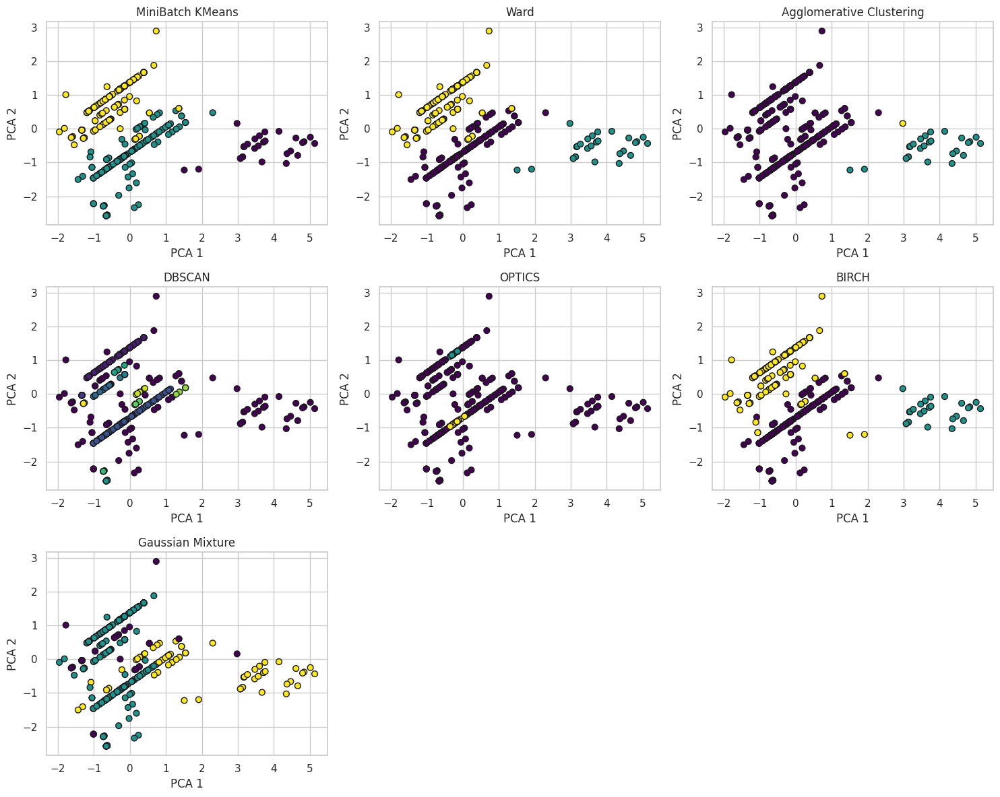

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12))
ax = axes.flatten()

# Aplicar cada algoritmo de clustering y visualizar los resultados
for i, (name, algorithm) in enumerate(clustering_algorithms):
    # Ajustar el modelo
    if hasattr(algorithm, 'fit_predict'):
        clusters = algorithm.fit_predict(X)
    else:
        algorithm.fit(X_scaled)
        clusters = algorithm.predict(X)

    # Reducir la dimensionalidad para visualización con PCA
    pca = PCA(n_components=2)
    X_r = pca.fit_transform(X)

    # Visualizar los clusters
    ax[i].scatter(X_r[:, 0], X_r[:, 1], c=clusters, cmap='viridis', edgecolor='k', s=40)
    ax[i].set_title(f'{name}')
    ax[i].set_xlabel('PCA 1')
    ax[i].set_ylabel('PCA 2')


for j in range(i + 1, 9):
    fig.delaxes(ax[j])


plt.tight_layout()
plt.show()

Y ahora vamos a realizar lo mismo, pero para 3 dimensiones:

In [ ]:
# Número de filas y columnas para los subplots
rows = 3
cols = 3

# Crear subplots
fig = make_subplots(
    rows=rows,
    cols=cols,
    specs=[[{'type': 'scatter3d'} for _ in range(cols)] for _ in range(rows)],
    subplot_titles=[name for name, _ in clustering_algorithms]
)

# Aplicar cada algoritmo de clustering y visualizar los resultados
for i, (name, algorithm) in enumerate(clustering_algorithms):
    row, col = (i // cols) + 1, (i % cols) + 1

    # Ajustar el modelo
    if hasattr(algorithm, 'fit_predict'):
        clusters = algorithm.fit_predict(X)
    else:
        algorithm.fit(X_scaled)
        clusters = algorithm.predict(X)

    # Reducir la dimensionalidad para visualización con PCA a 3 componentes
    pca = PCA(n_components=3)
    X_r = pca.fit_transform(X)

    # Agregar traza para cada clustering en su respectivo subplot
    fig.add_trace(
        go.Scatter3d(
            x=X_r[:, 0], y=X_r[:, 1], z=X_r[:, 2],
            mode='markers',
            marker=dict(
                size=5,
                color=clusters,  # Color de los puntos según el cluster al que pertenecen
                colorscale='Viridis',  # Escala de colores para visualizar los clusters
                opacity=0.8
            ),
            name=name,
            showlegend=False
        ),
        row=row, col=col
    )

# Actualizar layout del gráfico
fig.update_layout(
    height=1200, width=1200,
    margin=dict(l=0, r=0, b=0, t=30)
)

# Ajustar las propiedades de los ejes de cada subplot
for i in range(len(clustering_algorithms)):
    row, col = (i // cols) + 1, (i % cols) + 1
    fig.update_scenes(
        dict(
            xaxis_title='PCA 1',
            yaxis_title='PCA 2',
            zaxis_title='PCA 3'
        ),
        row=row, col=col
    )

# Mostrar la figura
fig.show()

Por lo que, con las representaciones tanto en 2 como en 3 dimensiones, reiteramos en la conclusión que hemos mencionado anteriormente. Los algoritmos $MiniBatch KMeans$, $AgglomerativeClustering$ con $Ward$, $BIRCH$ y $Gaussian Mixture$ tienen comportamientos bastante similares.

Por otro lado, el algoritmo $AgglomerativeClustering$ con $Average$ genera una componente principal, en la cual agrupa la mayoría de instancia, mientras que en las otras 2 incluye menos y son consideradas como outliers. Este tipo algoritmo a su vez destaca por siempre intentar agrupar todo en una gran componente y dejar los valores lejanos fuera.

Por otro lado, encontramos $DBSCAN$ y $OPTICS$, los cuales ambos son métodos basados en densidad. Por ejemplo, en el caso de DBSCAN, no genera únicamente 3 clusters, genera más, ya que se basa en la distancia o radio entre los puntos.

## Conclusiones
En este segmento, hemos investigado una variedad de técnicas de clustering aplicadas al dataset que hemos utilizado (relojes de lujo) a lo largo de este documento. Se ha analizado detenidamente la manera en que cada técnica particiona los datos y organiza los clusters.

Además, se ha explorado la importancia del preprocesamiento mediante técnicas de normalización, destacando su esencial contribución al rendimiento efectivo de los métodos de clustering.

# Conclusiones finales de la práctica
En esta práctica por tanto, hemos trabajado y mejorado en los siguientes aspectos:
* Búsqueda de datasets en Kaggle para las tareas requeridas.
* Uso de Kaggle con control de versiones y plataforma para ejecutar código de forma remota.
* Tareas de análisis de dataset, balanceo de datos, selección de características...
* Uso de algoritmos de Regresión junto a sus medidas en caso real.
* Uso de algoritmos de Clasificación junto a sus medidas en caso real.
* Composición de ensembles para tarea de clasificación
* Uso y representación de algoritmos de Clustering.

Por lo que ha sido una práctica muy provechosa para el alumno (Yo, David), en la que se ha aprendido mucho acerca de las diferentes problematicas a las que me puedo llegar a enfrentar en un futuro.